In [0]:
%sh
apt-get install -y graphviz

Reading package lists...
Building dependency tree...
Reading state information...
The following additional packages will be installed:
  fonts-liberation libann0 libcdt5 libcgraph6 libgts-0.7-5 libgts-bin libgvc6
  libgvpr2 liblab-gamut1 libpathplan4
Suggested packages:
  graphviz-doc
The following NEW packages will be installed:
  fonts-liberation graphviz libann0 libcdt5 libcgraph6 libgts-0.7-5 libgts-bin
  libgvc6 libgvpr2 liblab-gamut1 libpathplan4
0 upgraded, 11 newly installed, 0 to remove and 25 not upgraded.
Need to get 2701 kB of archives.
After this operation, 11.3 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/main amd64 fonts-liberation all 1:1.07.4-11 [822 kB]
Get:2 http://archive.ubuntu.com/ubuntu focal/universe amd64 libann0 amd64 1.1.2+doc-7build1 [26.0 kB]
Get:3 http://archive.ubuntu.com/ubuntu focal/universe amd64 libcdt5 amd64 2.42.2-3build2 [18.7 kB]
Get:4 http://archive.ubuntu.com/ubuntu focal/universe amd64 libcgraph6 amd64 

In [0]:
%sh
pip install dtreeviz[pyspark]

  Created wheel for pyspark: filename=pyspark-3.4.1-py2.py3-none-any.whl size=311285412 sha256=28c34a2b333a061cd1b0bb10a000514870f4b9a23e898b5fcff5b23e9ece20f4
  Stored in directory: /root/.cache/pip/wheels/07/9f/04/fc2c478c8c87334f0ff48e86fa7d8c2a814f9df5dc21d79b7e
Successfully built pyspark
You should consider upgrading via the '/databricks/python3/bin/python -m pip install --upgrade pip' command.


In [0]:
%sh
dot -V

dot - graphviz version 2.43.0 (0)


In [0]:
from pyspark.sql.functions import col,isnan, when, count
from pyspark.sql.types import IntegerType, DoubleType
from pyspark import SparkFiles
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
#그래프의 모양을 설정
plt.style.use('seaborn')
#글자 크기 설정 
sns.set(font_scale=2) 

#경고 메시지가 출력되지 않도록 설정
import warnings
warnings.filterwarnings('ignore')

In [0]:
#구글 드라이버에서 다운로드 받을 파일의 URL
url = "https://drive.google.com/uc?id=1hLyqMbl5foc96lDJk6_KWJ_RLVOtIzIJ"

In [0]:
#구글드라이버 파일을 다운 받아서 폴더에 저장
spark.sparkContext.addFile(url)

In [0]:
#구글 드라이버 파일을 다운로드 받은 폴더 경로 조회
SparkFiles.getRootDirectory()

Out[7]: '/local_disk0/spark-04249984-afb5-4bc5-b470-4d1bafa2897b/userFiles-b6fcbd8b-8404-4191-808a-d433563013b4'

In [0]:
#구글 드라이버 파일을 다운로드 받은 폴더 파일 리스트 조회
os.listdir(SparkFiles.getRootDirectory())

Out[8]: ['uc']

In [0]:
#SparkFiles.get("uc") : 다운로드 받은 폴더 (SparkFiles.getRootDirectory()) 의 파일명 uc 를 읽어서 리턴
#spark.read.csv() : csv 파일을 SparkDataFrame으로 생성해서 리턴
#header=True : csv 파일의 첫번째 줄은 칸 이름임
df_train = spark.read.csv("file://"+SparkFiles.get("uc"), header=True)

In [0]:
# df_train에 저장된 데이터 출력
display(df_train)

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived
1,3,"Braund, Mr. Owen Harris",male,22,1,0,A/5 21171,7.25,null,S,0
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38,1,0,PC 17599,71.2833,C85,C,1
3,3,"Heikkinen, Miss. Laina",female,26,0,0,STON/O2. 3101282,7.925,null,S,1
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35,1,0,113803,53.1,C123,S,1
5,3,"Allen, Mr. William Henry",male,35,0,0,373450,8.05,null,S,0
6,3,"Moran, Mr. James",male,null,0,0,330877,8.4583,null,Q,0
7,1,"McCarthy, Mr. Timothy J",male,54,0,0,17463,51.8625,E46,S,0
8,3,"Palsson, Master. Gosta Leonard",male,2,3,1,349909,21.075,null,S,0
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27,0,2,347742,11.1333,null,S,1
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14,1,0,237736,30.0708,null,C,1


In [0]:
# csv 파일을 읽어 들인 df_train 의 타입은 spark 의 DataFrame
type(df_train)

Out[11]: pyspark.sql.dataframe.DataFrame

In [0]:
# df_train 의 컬럼 타입 조회
df_train.schema

Out[12]: StructType(List(StructField(PassengerId,StringType,true),StructField(Pclass,StringType,true),StructField(Name,StringType,true),StructField(Sex,StringType,true),StructField(Age,StringType,true),StructField(SibSp,StringType,true),StructField(Parch,StringType,true),StructField(Ticket,StringType,true),StructField(Fare,StringType,true),StructField(Cabin,StringType,true),StructField(Embarked,StringType,true),StructField(Survived,StringType,true)))

In [0]:
#데이터 프레임의 컬럼 이름 조회
df_train.schema.names

Out[13]: ['PassengerId',
 'Pclass',
 'Name',
 'Sex',
 'Age',
 'SibSp',
 'Parch',
 'Ticket',
 'Fare',
 'Cabin',
 'Embarked',
 'Survived']

In [0]:
#데이터 프레임의 컬럼 이름을 column_name_list에 대입
column_name_list = df_train.schema.names

In [0]:
#데이터 프레임 컬럼 이름 조회
column_name_list

Out[15]: ['PassengerId',
 'Pclass',
 'Name',
 'Sex',
 'Age',
 'SibSp',
 'Parch',
 'Ticket',
 'Fare',
 'Cabin',
 'Embarked',
 'Survived']

In [0]:
#데이터 프레임의 인덱스 1 컬럼 이름 조회
column_name_list[1:2]

Out[16]: ['Pclass']

In [0]:
#데이터 프레임의 인덱스 4 컬럼 이름 조회
column_name_list[4:5]

Out[17]: ['Age']

In [0]:
#데이터 프레임의 인덱스 5~인덱스 6 컬럼 이름 조회
column_name_list[5:7]

Out[18]: ['SibSp', 'Parch']

In [0]:
#데이터 프레임의 인덱스 8 컬럼 이름 조회
column_name_list[8:9]

Out[19]: ['Fare']

In [0]:
#데이터 프레임의 인덱스 11 컬럼 이름 조회
column_name_list[11:12]

Out[20]: ['Survived']

In [0]:
#column_name_list[1:2] : 데이터 프레임의 인덱스 1 컬럼 이름 조회['Pclass']
# column_name_list[5:7] : 데이터 프레임의 인덱스 5~인덱스 6 컬럼 이름 조회 ['SibSp', 'Parch']
#column_name_list[11:12] : 데이터 프레임의 인덱스 11 컬럼 이름 조회 ['Survived']
#을 하나로 합쳐서 int_column_list 에 대입 (숫자 타입의 컬럼)
int_column_list = column_name_list[1:2] + column_name_list[5:7]  + column_name_list[11:12]

In [0]:
int_column_list

Out[22]: ['Pclass', 'SibSp', 'Parch', 'Survived']

In [0]:
#int_column_list 의 숫자 타입 컬럼이 String 타입으로 설정 되 있으므로
#숫자 타입으로 변환
for column_name in  int_column_list :
    # df_train.withColumn(column_name : column_name 컬럼 수정
    # df_train[column_name].cast('int') : column_name 컬럼의 타입을 int (정수) 로 변환해서 리턴
    print("column_name = ", column_name)
    df_train = df_train.withColumn(column_name, df_train[column_name].cast('int'))
    print("=" * 100)

column_name =  Pclass
column_name =  SibSp
column_name =  Parch
column_name =  Survived


In [0]:
# df_train 의 컬럼 타입 조회
df_train.schema

Out[24]: StructType(List(StructField(PassengerId,StringType,true),StructField(Pclass,IntegerType,true),StructField(Name,StringType,true),StructField(Sex,StringType,true),StructField(Age,StringType,true),StructField(SibSp,IntegerType,true),StructField(Parch,IntegerType,true),StructField(Ticket,StringType,true),StructField(Fare,StringType,true),StructField(Cabin,StringType,true),StructField(Embarked,StringType,true),StructField(Survived,IntegerType,true)))

In [0]:
#column_name_list[4:7] : 데이터 프레임의 인덱스 4  컬럼 이름 ['Age']
#column_name_list[8:10] : 데이터 프레임의 인덱스 8 ~ 인덱스 9 컬럼 이름 ['Fare']
#을 하나로 합쳐서 double_column_list 에 대입 (실수 타입의 컬럼)
double_column_list = column_name_list[4:5] + column_name_list[8:9] 

In [0]:
double_column_list

Out[26]: ['Age', 'Fare']

In [0]:

#double_column_list 의 실수 타입 컬럼이 String 타입으로 설정 되 있으므로
#실수 타입으로 변환
for column_name in  double_column_list :
    # df_train.withColumn(column_name : column_name 컬럼 수정
    # df_train[column_name].cast('double') : column_name 컬럼의 타입을 double (실수) 로 변환해서 리턴
    print("column_name = ", column_name)
    df_train = df_train.withColumn(column_name, df_train[column_name].cast('double'))
    print("=" * 100)

column_name =  Age
column_name =  Fare


In [0]:
# df_train 의 컬럼 타입 조회
df_train.schema

Out[28]: StructType(List(StructField(PassengerId,StringType,true),StructField(Pclass,IntegerType,true),StructField(Name,StringType,true),StructField(Sex,StringType,true),StructField(Age,DoubleType,true),StructField(SibSp,IntegerType,true),StructField(Parch,IntegerType,true),StructField(Ticket,StringType,true),StructField(Fare,DoubleType,true),StructField(Cabin,StringType,true),StructField(Embarked,StringType,true),StructField(Survived,IntegerType,true)))

In [0]:
# df_train에 저장된 데이터 출력
display(df_train)

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.25,null,S,0
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,71.2833,C85,C,1
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.925,null,S,1
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1,C123,S,1
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.05,null,S,0
6,3,"Moran, Mr. James",male,null,0,0,330877,8.4583,null,Q,0
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,51.8625,E46,S,0
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,21.075,null,S,0
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,11.1333,null,S,1
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,30.0708,null,C,1


In [0]:
#각 컬럼의 개수,평균,표준편차,최소값등을 출력
display(df_train.summary())

summary,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived
count,891,891,891,891,714,891,891,891,891,204,889,891
mean,446.0,2.308641975308642,null,null,29.69911764705882,0.5230078563411896,0.38159371492704824,260318.54916792738,32.2042079685746,null,null,0.3838383838383838
stddev,257.3538420152301,0.8360712409770491,null,null,14.526497332334035,1.1027434322934315,0.8060572211299488,471609.26868834975,49.69342859718089,null,null,0.48659245426485753
min,1,1,"""Andersson, Mr. August Edvard (""""Wennerstrom"""")""",female,0.42,0,0,110152,0.0,A10,C,0
25%,223.0,2,null,null,20.0,0,0,19996.0,7.8958,null,null,0
50%,446.0,3,null,null,28.0,0,0,236171.0,14.4542,null,null,0
75%,669.0,3,null,null,38.0,1,0,347743.0,31.0,null,null,1
max,99,3,"van Melkebeke, Mr. Philemon",male,80.0,8,6,WE/P 5735,512.3292,T,S,1


In [0]:
#df_train의 행의 개수 출력
df_train.count()

Out[31]: 891

In [0]:
#df_train 컬럼의 이름 조회
df_train.columns

Out[32]: ['PassengerId',
 'Pclass',
 'Name',
 'Sex',
 'Age',
 'SibSp',
 'Parch',
 'Ticket',
 'Fare',
 'Cabin',
 'Embarked',
 'Survived']

In [0]:
#df_train의 컬럼 이름을 조회
for column_name in df_train.columns:
    print("column_name =", column_name)
    print("=" * 100)

column_name = PassengerId
column_name = Pclass
column_name = Name
column_name = Sex
column_name = Age
column_name = SibSp
column_name = Parch
column_name = Ticket
column_name = Fare
column_name = Cabin
column_name = Embarked
column_name = Survived


In [0]:
#df_train.columns : df_train의 컬럼 이름을 조회

#for column_name in df_train.columns: df_train의 컬럼 이름을 column_name에 대입

#count(column_name) : 컬럼의 데이터 수 조회(결측치 제외) 

# df_train.select 데이터 조회


df_train.select([count(column_name) for column_name in df_train.columns] ).show()

+------------------+-------------+-----------+----------+----------+------------+------------+-------------+-----------+------------+---------------+---------------+
|count(PassengerId)|count(Pclass)|count(Name)|count(Sex)|count(Age)|count(SibSp)|count(Parch)|count(Ticket)|count(Fare)|count(Cabin)|count(Embarked)|count(Survived)|
+------------------+-------------+-----------+----------+----------+------------+------------+-------------+-----------+------------+---------------+---------------+
|               891|          891|        891|       891|       714|         891|         891|          891|        891|         204|            889|            891|
+------------------+-------------+-----------+----------+----------+------------+------------+-------------+-----------+------------+---------------+---------------+



In [0]:
#df_train.columns : df_train의 컬럼 이름을 조회

#for column_name in df_train.columns: df_train의 컬럼 이름을 column_name에 대입

#count(column_name) : 컬럼의 데이터 수 조회(결측치 제외) 

# df_train.select 데이터 조회
#alias(column_name) : 컬럼 이름 출력

df_train.select([count(column_name).alias(column_name) for column_name in df_train.columns] ).show()

+-----------+------+----+---+---+-----+-----+------+----+-----+--------+--------+
|PassengerId|Pclass|Name|Sex|Age|SibSp|Parch|Ticket|Fare|Cabin|Embarked|Survived|
+-----------+------+----+---+---+-----+-----+------+----+-----+--------+--------+
|        891|   891| 891|891|714|  891|  891|   891| 891|  204|     889|     891|
+-----------+------+----+---+---+-----+-----+------+----+-----+--------+--------+



In [0]:
#df_train.columns : df_train의 컬럼 이름을 조회

#for column_name in df_train.columns: df_train의 컬럼 이름을 column_name에 대입

# isnan(column_name) : 컬럼 데이터가 nan (숫자일때 결측치)
# col(column_name).isNull() : 컬럼 데이터가 Null (문자열일때 결측치)

#count(when(isnan(column_name) | col(column_name).isNull(), column_name)) : 컬럼 데이터가 nan (숫자일때 결측치) 이거나 컬럼 데이터가 Null (문자열일때 결측치)
# 일때 데이터의 개수를 셈

# df_train.select 데이터 조회
#alias(column_name) : 컬럼 이름 출력
df_train.select(
                [
                    count(when(isnan(column_name) | col(column_name).isNull(), column_name)).alias(column_name) 
                    
                    for column_name in df_train.columns
                ] 
                
                ).show()

+-----------+------+----+---+---+-----+-----+------+----+-----+--------+--------+
|PassengerId|Pclass|Name|Sex|Age|SibSp|Parch|Ticket|Fare|Cabin|Embarked|Survived|
+-----------+------+----+---+---+-----+-----+------+----+-----+--------+--------+
|          0|     0|   0|  0|177|    0|    0|     0|   0|  687|       2|       0|
+-----------+------+----+---+---+-----+-----+------+----+-----+--------+--------+



In [0]:
#결측치의 비율 조회

#df_train.columns : df_train의 컬럼 이름을 조회

#for column_name in df_train.columns: df_train의 컬럼 이름을 column_name에 대입

# isnan(column_name) : 컬럼 데이터가 nan (숫자일때 결측치)
# col(column_name).isNull() : 컬럼 데이터가 Null (문자열일때 결측치)

#count(when(isnan(column_name) | col(column_name).isNull(), column_name)) : 컬럼 데이터가 nan (숫자일때 결측치) 이거나 컬럼 데이터가 Null (문자열일때 결측치)
# 일때 데이터의 개수를 셈

# df_train.count() : 전체 데이터의 행의 개수 조회

# df_train.select 데이터 조회
#alias(column_name) : 컬럼 이름 출력
df_train.select(
                [
                    ( count(when(isnan(column_name) | col(column_name).isNull(), column_name)) /  df_train.count() ) .alias(column_name) 
                    
                    for column_name in df_train.columns
                ] 
                
                ).show()

+-----------+------+----+---+-------------------+-----+-----+------+----+------------------+--------------------+--------+
|PassengerId|Pclass|Name|Sex|                Age|SibSp|Parch|Ticket|Fare|             Cabin|            Embarked|Survived|
+-----------+------+----+---+-------------------+-----+-----+------+----+------------------+--------------------+--------+
|        0.0|   0.0| 0.0|0.0|0.19865319865319866|  0.0|  0.0|   0.0| 0.0|0.7710437710437711|0.002244668911335578|     0.0|
+-----------+------+----+---+-------------------+-----+-----+------+----+------------------+--------------------+--------+



Out[38]: <AxesSubplot:>

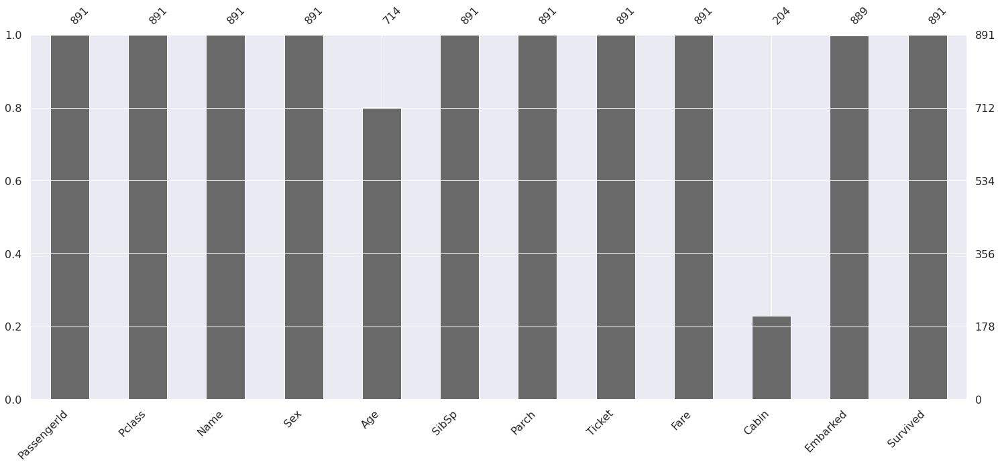

In [0]:
import missingno as msno
#msno.bar는 각 컬럼의 null 이 아닌 데이터의 비율을 그래프로 그려주는 패키지
# df_train.toPandas() : Spark DataFrame인 df_train 을 Pandas DataFrame으로 변환 
msno.bar(df=df_train.toPandas())

In [0]:
#Serviced 컬럼에 저장된 값들의 빈도수 조회
#0 사망자 549명
#1 생존자 342명
df_train.groupBy('Survived').count().show()

+--------+-----+
|Survived|count|
+--------+-----+
|       1|  342|
|       0|  549|
+--------+-----+



In [0]:
#티켓 클래스의 빈도수 조회
df_train.groupBy('Pclass').count().show()

+------+-----+
|Pclass|count|
+------+-----+
|     1|  216|
|     3|  491|
|     2|  184|
+------+-----+



In [0]:
# SQL 사용을 위해서 Spark DataFrame을 View(데이터를 추가 수정 할 수 없는 테이블) 형태로 변환
df_train.createOrReplaceTempView('titanic_view')

In [0]:
%sql

--생존자 Survived=1 인 줄 의 데이터 조회
select * from titanic_view where Survived=1

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,71.2833,C85,C,1
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.925,null,S,1
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1,C123,S,1
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,11.1333,null,S,1
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,30.0708,null,C,1
11,3,"Sandstrom, Miss. Marguerite Rut",female,4.0,1,1,PP 9549,16.7,G6,S,1
12,1,"Bonnell, Miss. Elizabeth",female,58.0,0,0,113783,26.55,C103,S,1
16,2,"Hewlett, Mrs. (Mary D Kingcome)",female,55.0,0,0,248706,16.0,null,S,1
18,2,"Williams, Mr. Charles Eugene",male,null,0,0,244373,13.0,null,S,1
20,3,"Masselmani, Mrs. Fatima",female,null,0,0,2649,7.225,null,C,1


In [0]:
%sql
--생존자 Survived=1 인 줄 의 PClass  칸 조회
select Pclass from titanic_view where Survived=1

Pclass
1
3
1
3
2
3
1
2
2
3


In [0]:
%sql
--생존자 Survived=1 인 줄 의 PClass  칸 조회
select Pclass, count(*) from titanic_view where Survived=1 group by Pclass

Pclass,count(1)
1,136
3,119
2,87


In [0]:
%sql
-- Pclass, Survived 별 데이터의 수 조회
-- Pclass 의 오름  차순으로 정렬 같은 Pclass 안에서는 Survived 컬럼의 내림차순 정렬
select Pclass, Survived, count(*) from titanic_view group by   Pclass, Survived order by Pclass, Survived Desc

Pclass,Survived,count(1)
1,1,136
1,0,80
2,1,87
2,0,97
3,1,119
3,0,372


In [0]:
#Pclass칸과 Survived칸을 교차해서 빈도수를 출력
df_train.crosstab('Pclass','Survived').show()

+---------------+---+---+
|Pclass_Survived|  0|  1|
+---------------+---+---+
|              1| 80|136|
|              3|372|119|
|              2| 97| 87|
+---------------+---+---+



In [0]:
%sql
-- Sex, Survived 별 데이터의 수 조회
-- Sex 의 오름  차순으로 정렬 같은 Sex 안에서는 Survived 컬럼의 내림차순 정렬
select Sex, Survived, count(*) from titanic_view group by   Sex, Survived order by Sex, Survived Desc

Sex,Survived,count(1)
female,1,233
female,0,81
male,1,109
male,0,468


In [0]:
#Sex 과 Survived칸을 교차해서 빈도수를 출력
df_train.crosstab('Sex','Survived').show()

+------------+---+---+
|Sex_Survived|  0|  1|
+------------+---+---+
|        male|468|109|
|      female| 81|233|
+------------+---+---+



Out[49]: <seaborn.axisgrid.FacetGrid at 0x7fb420309d30>

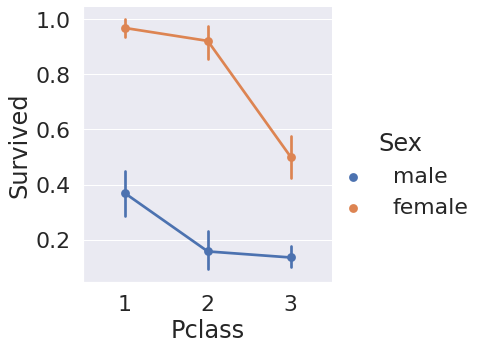

In [0]:
# df_train.toPandas() : Spark DataFrame인 df_train 을 Pandas DataFrame으로 변환 
#각 성별별로 Pclass컬럼과 Survived컬럼을 교차해서 그래프를 그림
#sns.factorplot(컬럼1, 컬럼2, hue=범주에사용할 컬럼, data=데이터프레임)

sns.factorplot('Pclass', 'Survived', hue='Sex', data=df_train.toPandas())

In [0]:
#df_train['Survived'] == 1] 인 행 대입 
df_train.filter(df_train["Survived"] == 1).show()

+-----------+------+--------------------+------+----+-----+-----+----------------+--------+-----+--------+--------+
|PassengerId|Pclass|                Name|   Sex| Age|SibSp|Parch|          Ticket|    Fare|Cabin|Embarked|Survived|
+-----------+------+--------------------+------+----+-----+-----+----------------+--------+-----+--------+--------+
|          2|     1|Cumings, Mrs. Joh...|female|38.0|    1|    0|        PC 17599| 71.2833|  C85|       C|       1|
|          3|     3|Heikkinen, Miss. ...|female|26.0|    0|    0|STON/O2. 3101282|   7.925| null|       S|       1|
|          4|     1|Futrelle, Mrs. Ja...|female|35.0|    1|    0|          113803|    53.1| C123|       S|       1|
|          9|     3|Johnson, Mrs. Osc...|female|27.0|    0|    2|          347742| 11.1333| null|       S|       1|
|         10|     2|Nasser, Mrs. Nich...|female|14.0|    1|    0|          237736| 30.0708| null|       C|       1|
|         11|     3|Sandstrom, Miss. ...|female| 4.0|    1|    1|       

In [0]:
#df_train['Age'] 컬럼에서 df_train['Survived'] == 1] 인 행 조회
df_train[["Age"]].filter(df_train["Survived"] == 1).show()

+----+
| Age|
+----+
|38.0|
|26.0|
|35.0|
|27.0|
|14.0|
| 4.0|
|58.0|
|55.0|
|null|
|null|
|34.0|
|15.0|
|28.0|
|38.0|
|null|
|null|
|null|
|null|
|14.0|
| 3.0|
+----+
only showing top 20 rows



In [0]:
#df_train['Age'] 컬럼에서 [df_train['Survived'] == 0 인 행 조회
df_train[["Age"]].filter(df_train["Survived"] == 0).show()


+----+
| Age|
+----+
|22.0|
|35.0|
|null|
|54.0|
| 2.0|
|20.0|
|39.0|
|14.0|
| 2.0|
|31.0|
|35.0|
| 8.0|
|null|
|19.0|
|null|
|40.0|
|66.0|
|28.0|
|42.0|
|21.0|
+----+
only showing top 20 rows



Out[53]: <matplotlib.legend.Legend at 0x7fb42039cc70>

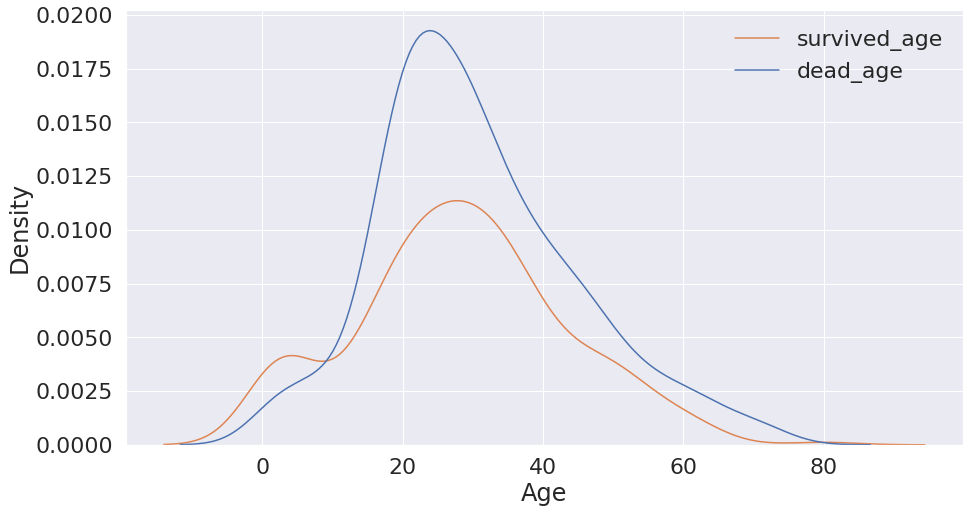

In [0]:
#Age컬럼에서 각 나이별 사망자 생존자 비율을 그래프로 그림

#그래프의 크기 설정 가로15 세로8
plt.figure(figsize=(15,8))
#sns.kdeplot 는 비율을 그래프로 그려줌
sns.kdeplot(data=df_train.toPandas() , x="Age", hue="Survived")
#범례를 설정
plt.legend(['survived_age', 'dead_age'])

In [0]:
%sql
-- Embarked, Survived 별 데이터의 수 조회
-- Embarked 의 오름 차순으로 정렬하고 같은 Embarked안에서는 Survived 컬럼의 내림차순 정렬
select Embarked, Survived, count(*) 
from titanic_view 
group by  Embarked, Survived 
order by Embarked, Survived Desc

Embarked,Survived,count(1)
null,1,2
C,1,93
C,0,75
Q,1,30
Q,0,47
S,1,217
S,0,427


In [0]:
#Embarked컬럼과 Survived컬럼을 교차해서 빈도수 조회

df_train.crosstab('Embarked', 'Survived').show()

+-----------------+---+---+
|Embarked_Survived|  0|  1|
+-----------------+---+---+
|             null|  0|  2|
|                Q| 47| 30|
|                S|427|217|
|                C| 75| 93|
+-----------------+---+---+



In [0]:
##Embarked컬럼과 Pclass컬럼을 교차해서 빈도수 조회

df_train.crosstab('Embarked', 'Pclass').show()

+---------------+---+---+---+
|Embarked_Pclass|  1|  2|  3|
+---------------+---+---+---+
|              S|127|164|353|
|              Q|  2|  3| 72|
|              C| 85| 17| 66|
|           null|  2|  0|  0|
+---------------+---+---+---+



In [0]:
#Pclass컬럼과 Survived 컬럼의 연관 관계
df_train.corr("Pclass","Survived")

Out[57]: -0.33848103596101514

In [0]:
#컬럼타입 df_train.schema 을 순서대로 column에 대입
for column in df_train.schema :
    #컬럼명 조회
    print("column.name = ", column.name)
    #컬럼 타입 조회
    print("column.dataType = ", column.dataType)
    print("=" * 100)

column.name =  PassengerId
column.dataType =  StringType
column.name =  Pclass
column.dataType =  IntegerType
column.name =  Name
column.dataType =  StringType
column.name =  Sex
column.dataType =  StringType
column.name =  Age
column.dataType =  DoubleType
column.name =  SibSp
column.dataType =  IntegerType
column.name =  Parch
column.dataType =  IntegerType
column.name =  Ticket
column.dataType =  StringType
column.name =  Fare
column.dataType =  DoubleType
column.name =  Cabin
column.dataType =  StringType
column.name =  Embarked
column.dataType =  StringType
column.name =  Survived
column.dataType =  IntegerType


In [0]:
#컬럼타입 df_train.schema 을 순서대로 column에 대입
for column in df_train.schema :
    #컬럼명 조회
    print("column.name = ", column.name)
    #컬럼 타입 조회
    print("column.dataType = ", column.dataType)
    
    #컬럼 타입이 IntegerType() : 정수
    # 컬럼 타입이 DoubleType() : 실수 이면
    if (column.dataType == IntegerType()) or (column.dataType==DoubleType()):
        print("numeric type")
        
    print("=" * 100)


column.name =  PassengerId
column.dataType =  StringType
column.name =  Pclass
column.dataType =  IntegerType
numeric type
column.name =  Name
column.dataType =  StringType
column.name =  Sex
column.dataType =  StringType
column.name =  Age
column.dataType =  DoubleType
numeric type
column.name =  SibSp
column.dataType =  IntegerType
numeric type
column.name =  Parch
column.dataType =  IntegerType
numeric type
column.name =  Ticket
column.dataType =  StringType
column.name =  Fare
column.dataType =  DoubleType
numeric type
column.name =  Cabin
column.dataType =  StringType
column.name =  Embarked
column.dataType =  StringType
column.name =  Survived
column.dataType =  IntegerType
numeric type


In [0]:
#정수 타입 혹은 실수 타입 컬럼의 이름을 저장할 리스트
numeric_column_list=[]

#컬럼타입 df_train.schema 을 순서대로 column에 대입
for column in df_train.schema :
    #컬럼명 조회
    print("column.name = ", column.name)
    #컬럼 타입 조회
    print("column.dataType = ", column.dataType)
    
    #컬럼 타입이 IntegerType() : 정수
    # 컬럼 타입이 DoubleType() : 실수 이면
    if (column.dataType == IntegerType()) or (column.dataType==DoubleType()):
        print("numeric type")
        #컬럼의 이름을 numeric_column_list에 저장
        numeric_column_list.append(column.name)
        
    print("=" * 100)

column.name =  PassengerId
column.dataType =  StringType
column.name =  Pclass
column.dataType =  IntegerType
numeric type
column.name =  Name
column.dataType =  StringType
column.name =  Sex
column.dataType =  StringType
column.name =  Age
column.dataType =  DoubleType
numeric type
column.name =  SibSp
column.dataType =  IntegerType
numeric type
column.name =  Parch
column.dataType =  IntegerType
numeric type
column.name =  Ticket
column.dataType =  StringType
column.name =  Fare
column.dataType =  DoubleType
numeric type
column.name =  Cabin
column.dataType =  StringType
column.name =  Embarked
column.dataType =  StringType
column.name =  Survived
column.dataType =  IntegerType
numeric type


In [0]:
#정수 타입 혹은 실수 타입 컬럼의 이름 조회
numeric_column_list

Out[61]: ['Pclass', 'Age', 'SibSp', 'Parch', 'Fare', 'Survived']

In [0]:
#numeric_column_list : 정수 타입 혹은 실수 타입 컬럼의 이름

for column_name in numeric_column_list:
    #컬럼 이름 조회
    print("column_name =", column_name)
    print("="*100)

column_name = Pclass
column_name = Age
column_name = SibSp
column_name = Parch
column_name = Fare
column_name = Survived


In [0]:
#numeric_column_list : 정수 타입 혹은 실수 타입 컬럼의 이름

for column_name in numeric_column_list:
    #컬럼 이름 조회
    print("column_name =", column_name)
    
    #column_name 컬럼과 Survived 컬럼의 연관 관계
    print( df_train.corr(column_name,"Survived") )
    print("="*100)

column_name = Pclass
-0.33848103596101514
column_name = Age
0.010539215871285685
column_name = SibSp
-0.03532249888573558
column_name = Parch
0.08162940708348336
column_name = Fare
0.2573065223849626
column_name = Survived
1.0


In [0]:
#df_train 를 Pandas DataFrame으로 변환해서 psample_df에 대입
psample_df = df_train.toPandas()

In [0]:
psample_df

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived
0,1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,None,S,0
1,2,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C,1
2,3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,None,S,1
3,4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S,1
4,5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,None,S,0
...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,None,S,0
887,888,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S,1
888,889,3,"""Johnston, Miss. Catherine Helen """"Carrie""""""",female,NaN,1,2,W./C. 6607,23.4500,None,S,0
889,890,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C148,C,1


In [0]:
# skew() : 컬럼의 기울임 조회
psample_df.skew()

Out[66]: PassengerId    0.000000
Pclass        -0.630548
Age            0.389108
SibSp          3.695352
Parch          2.749117
Fare           4.787317
Survived       0.478523
dtype: float64

Out[67]: (array([732., 106.,  31.,   2.,  11.,   6.,   0.,   0.,   0.,   3.]),
 array([  0.     ,  51.23292, 102.46584, 153.69876, 204.93168, 256.1646 ,
        307.39752, 358.63044, 409.86336, 461.09628, 512.3292 ]),
 <BarContainer object of 10 artists>)

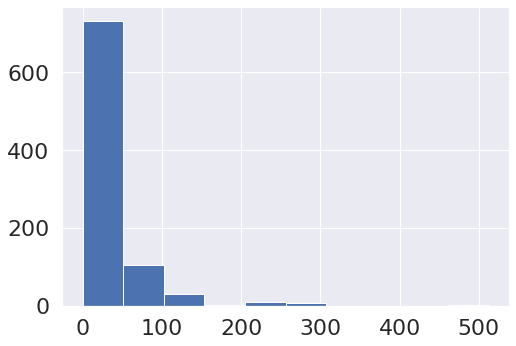

In [0]:
#가장 기울어진 컬럼 시각화
plt.hist(psample_df["Fare"])

In [0]:
df_train["Fare"]

Out[68]: Column<'Fare'>

In [0]:
from pyspark.sql.functions import log1p

# df_train.withColumn(수정할 컬럼의 이름, 수정할 값)

#df_train.withColumn(Fare : Fare 컬럼의 값 수정

# log1p("Fare") : Fare에 log(1+데이터) 를 곱한 값을 리턴하는 log1p 호출해서 컬럼갑 수정

df_train = df_train.withColumn("Fare", log1p("Fare"))

In [0]:
display(df_train)

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0
6,3,"Moran, Mr. James",male,null,0,0,330877,2.246892662898172,null,Q,0
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1


In [0]:
#sample_df를 Pandas DataFrame으로 변환해서 psample_df에 대입
psample_df = df_train.toPandas()

In [0]:
psample_df

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived
0,1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.110213,None,S,0
1,2,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,4.280593,C85,C,1
2,3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856,None,S,1
3,4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.990834,C123,S,1
4,5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.202765,None,S,0
...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,2.639057,None,S,0
887,888,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,3.433987,B42,S,1
888,889,3,"""Johnston, Miss. Catherine Helen """"Carrie""""""",female,NaN,1,2,W./C. 6607,3.196630,None,S,0
889,890,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,3.433987,C148,C,1


In [0]:
# skew() : 컬럼의 기울임 조회
psample_df.skew()

Out[73]: PassengerId    0.000000
Pclass        -0.630548
Age            0.389108
SibSp          3.695352
Parch          2.749117
Fare           0.394928
Survived       0.478523
dtype: float64

Out[74]: (array([ 15.,   0.,   2., 350., 167., 182.,  85.,  59.,  28.,   3.]),
 array([0.        , 0.62409174, 1.24818347, 1.87227521, 2.49636694,
        3.12045868, 3.74455041, 4.36864215, 4.99273388, 5.61682562,
        6.24091735]),
 <BarContainer object of 10 artists>)

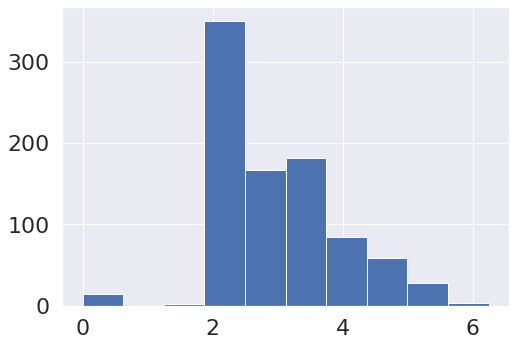

In [0]:
plt.hist(psample_df["Fare"])

In [0]:
#배우자 수와 부모 아이수를 합해서 FamilySize컬럼 생성

# df_train.withColumn(수정할 컬럼의 이름, 수정할 값)

# df_train.withColumn("FamilySize" : FamilySize 컬럼이 있으면 수정 없으면 추가

# df_train["SibSp"] : 배우자  수
# df_train["Parch"] : 동승한 부모 자식의 수

# df_train["SibSp"] + df_train["Parch"] + 1 : 컬럼값을 배우자 수와 부모 아이수 + 1로 수정
df_train.withColumn("FamilySize", df_train["SibSp"] + df_train["Parch"] + 1).show()

+-----------+------+--------------------+------+----+-----+-----+----------------+------------------+-----+--------+--------+----------+
|PassengerId|Pclass|                Name|   Sex| Age|SibSp|Parch|          Ticket|              Fare|Cabin|Embarked|Survived|FamilySize|
+-----------+------+--------------------+------+----+-----+-----+----------------+------------------+-----+--------+--------+----------+
|          1|     3|Braund, Mr. Owen ...|  male|22.0|    1|    0|       A/5 21171|2.1102132003465894| null|       S|       0|         2|
|          2|     1|Cumings, Mrs. Joh...|female|38.0|    1|    0|        PC 17599|   4.2805931204649|  C85|       C|       1|         2|
|          3|     3|Heikkinen, Miss. ...|female|26.0|    0|    0|STON/O2. 3101282| 2.188856327665703| null|       S|       1|         1|
|          4|     1|Futrelle, Mrs. Ja...|female|35.0|    1|    0|          113803|3.9908341858524357| C123|       S|       1|         2|
|          5|     3|Allen, Mr. Willia...|

In [0]:
#배우자 수와 부모 아이수를 합해서 FamilySize컬럼 생성해서 df_train에 대입

# df_train.withColumn(수정할 컬럼의 이름, 수정할 값)

# df_train.withColumn("FamilySize" : FamilySize 컬럼이 있으면 수정 없으면 추가

# df_train["SibSp"] : 배우자  수
# df_train["Parch"] : 동승한 부모 자식의 수

# df_train["SibSp"] + df_train["Parch"] + 1 : 컬럼값을 배우자 수와 부모 아이수 + 1로 수정
df_train = df_train.withColumn("FamilySize", df_train["SibSp"] + df_train["Parch"] + 1)

In [0]:
display(df_train)

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1
6,3,"Moran, Mr. James",male,null,0,0,330877,2.246892662898172,null,Q,0,1
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2


In [0]:
#FamilySize 과 Survived칸을 교차해서 빈도수를 출력
#df_train.crosstab(컬럼1,컬럼2)

df_train.crosstab('FamilySize', 'Survived').show()

+-------------------+---+---+
|FamilySize_Survived|  0|  1|
+-------------------+---+---+
|                  5| 12|  3|
|                  1|374|163|
|                  6| 19|  3|
|                  2| 72| 89|
|                  7|  8|  4|
|                  3| 43| 59|
|                 11|  7|  0|
|                  8|  6|  0|
|                  4|  8| 21|
+-------------------+---+---+



In [0]:
%sql

-- 새로 추가된 컬럼이 titanic_view에 적용이 않되있음
select * from titanic_view


PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.25,null,S,0
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,71.2833,C85,C,1
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.925,null,S,1
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1,C123,S,1
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.05,null,S,0
6,3,"Moran, Mr. James",male,null,0,0,330877,8.4583,null,Q,0
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,51.8625,E46,S,0
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,21.075,null,S,0
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,11.1333,null,S,1
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,30.0708,null,C,1


In [0]:
# 컬럼이 추가 되었으므로 Spark DataFrame을 View(데이터를 추가 수정 할 수 없는 테이블) 
# 형태로 다시 변환
df_train.createOrReplaceTempView('titanic_view')

In [0]:
%sql
-- 새로 추가된 컬럼 FamilySize가  titanic_view에 추가 되었음
select * from titanic_view

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1
6,3,"Moran, Mr. James",male,null,0,0,330877,2.246892662898172,null,Q,0,1
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2


In [0]:
%sql
-- FamilySize, Survived 별 데이터의 수 조회
-- FamilySize 의 오름 차순으로 정렬하고 같은 Family안에서는 Survived 컬럼의 내림차순 정렬
select FamilySize, Survived, count(*) 
from titanic_view group by  
FamilySize, Survived 
order by FamilySize, Survived Desc

FamilySize,Survived,count(1)
1,1,163
1,0,374
2,1,89
2,0,72
3,1,59
3,0,43
4,1,21
4,0,8
5,1,3
5,0,12


In [0]:
%sql
-- Name 컬럼 조회
select Name from titanic_view

Name
"Braund, Mr. Owen Harris"
"Cumings, Mrs. John Bradley (Florence Briggs Thayer)"
"Heikkinen, Miss. Laina"
"Futrelle, Mrs. Jacques Heath (Lily May Peel)"
"Allen, Mr. William Henry"
"Moran, Mr. James"
"McCarthy, Mr. Timothy J"
"Palsson, Master. Gosta Leonard"
"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)"
"Nasser, Mrs. Nicholas (Adele Achem)"


In [0]:
import re
#다음 단어중 하나를 포함하는 문자열을 찾기 위한 객체 p 생성
p = re.compile("Mrs|Mr|Miss|Master|Don|Dr|Ms|Major|Mlle|Mme|Countess|Lady|Don|Countess")

In [0]:
#이름에서 Mr Mrs Miss 를 리턴하는 함수

#매개변수 name_row : Name 컬럼의 이름 하나씩 순서대로 대입되는 매개변수

def get_sir(name_row):
    if p.search(name_row)!=None:
        #검색한 문자열이 'Countess',"Lady" 중 하나를 포함
        if p.search(name_row)[0] in ['Countess',"Lady"]:
            #Mrs를 리턴
            return "Mrs"
         #검색한 문자열이 '"Mme","Ms","Mlle" 중 하나를 포함    
        elif p.search(name_row)[0] in ["Mme","Ms","Mlle"]:
            #Miss를 리턴
            return "Miss" 
        #검색한  문자열이 '"Don","Dr","Major"중 하나를 포함    
        elif p.search(name_row)[0] in ["Don","Dr","Major"]: 
            #Mr 리턴
            return "Mr"
        else:
            #문자열을 리턴
            return p.search(name_row)[0]
    else:
        #Other를 리턴
        return "Other"

In [0]:
from pyspark.sql.functions import udf
from pyspark.sql.types import StringType

In [0]:
# get_sir 함수를 Spark DataFrame의 컬럼 값들을 수정해서 리턴 할 수 있는 함수로 변환
# udf(lambda 컬럼의 데이터 하나씩 저장할 변수: 함수명, 리턴받을 결과의타입)

udf_get_sir= udf(lambda x:get_sir(x), StringType() )

In [0]:
# df_train.withColumn(수정할 컬럼의 이름, 수정할 값)

#udf_get_sir 함수를 이용해서 Sir 컬럼 추가

#df_train.withColumn("Sir" : Sir 컬럼이 존재하면 Sir 컬럼 값 수정 없으면 추가

# df_train["Name"] : df_train에서 Name 컬럼 리턴

#udf_get_sir(df_train["Name"] )) : udf_get_sir 함수를 호출해서 이름에서 Mr Miss Mrs Master 추출
df_train.withColumn("Sir",udf_get_sir(df_train["Name"])).show()

+-----------+------+--------------------+------+----+-----+-----+----------------+------------------+-----+--------+--------+----------+------+
|PassengerId|Pclass|                Name|   Sex| Age|SibSp|Parch|          Ticket|              Fare|Cabin|Embarked|Survived|FamilySize|   Sir|
+-----------+------+--------------------+------+----+-----+-----+----------------+------------------+-----+--------+--------+----------+------+
|          1|     3|Braund, Mr. Owen ...|  male|22.0|    1|    0|       A/5 21171|2.1102132003465894| null|       S|       0|         2|    Mr|
|          2|     1|Cumings, Mrs. Joh...|female|38.0|    1|    0|        PC 17599|   4.2805931204649|  C85|       C|       1|         2|   Mrs|
|          3|     3|Heikkinen, Miss. ...|female|26.0|    0|    0|STON/O2. 3101282| 2.188856327665703| null|       S|       1|         1|  Miss|
|          4|     1|Futrelle, Mrs. Ja...|female|35.0|    1|    0|          113803|3.9908341858524357| C123|       S|       1|         2|

In [0]:
# 이름에서 Mr Miss Mrs Master 를 추출해서 df_train에 대입

# df_train.withColumn(수정할 컬럼의 이름, 수정할 값)

#udf_get_sir 함수를 이용해서 Sir 컬럼 추가

#df_train.withColumn("Sir" : Sir 컬럼이 존재하면 Sir 컬럼 값 수정 없으면 추가

# df_train["Name"] : df_train에서 Name 컬럼 리턴

#udf_get_sir(df_train["Name"] )) : udf_get_sir 함수를 호출해서 이름에서 Mr Miss Mrs Master 추출
df_train = df_train.withColumn("Sir",udf_get_sir(df_train["Name"]))

In [0]:
display(df_train)

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr
6,3,"Moran, Mr. James",male,null,0,0,330877,2.246892662898172,null,Q,0,1,Mr
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs


In [0]:
#Sir과 Survived의 빈도수를 교차해서 출력
df_train.crosstab('Sir', 'Survived').show()

+------------+---+---+
|Sir_Survived|  0|  1|
+------------+---+---+
|       Other|  9|  1|
|      Master| 17| 23|
|          Mr|442| 88|
|         Mrs| 26|100|
|        Miss| 55|130|
+------------+---+---+



In [0]:
%sql
-- 새로 추가된 컬럼이 titanic_view에 적용이 않되있음
select * from titanic_view

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1
6,3,"Moran, Mr. James",male,null,0,0,330877,2.246892662898172,null,Q,0,1
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2


In [0]:
# 컬럼이 추가 되었으므로 Spark DataFrame을 View(데이터를 추가 수정 할 수 없는 테이블) 
# 형태로 다시 변환
df_train.createOrReplaceTempView('titanic_view')

In [0]:
%sql
-- 새로 추가된 컬럼 Sir 가  titanic_view에 추가 되었음
select * from titanic_view

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr
6,3,"Moran, Mr. James",male,null,0,0,330877,2.246892662898172,null,Q,0,1,Mr
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs


In [0]:
%sql
-- Sir, Survived 별 데이터의 수 조회
-- Sir 의 오름 차순으로 정렬
select Sir, Survived, count(*) from titanic_view group by Sir, Survived order by Sir

Sir,Survived,count(1)
Master,0,17
Master,1,23
Miss,1,130
Miss,0,55
Mr,1,88
Mr,0,442
Mrs,0,26
Mrs,1,100
Other,0,9
Other,1,1


In [0]:

#Sir컬럼을 기준으로 평균 계산
df_train.groupby('Sir').mean().show()

+------+------------------+-----------------+-------------------+------------------+------------------+------------------+------------------+
|   Sir|       avg(Pclass)|         avg(Age)|         avg(SibSp)|        avg(Parch)|         avg(Fare)|     avg(Survived)|   avg(FamilySize)|
+------+------------------+-----------------+-------------------+------------------+------------------+------------------+------------------+
|  Miss| 2.281081081081081|            21.86| 0.7027027027027027|0.5405405405405406|3.1923512431103003|0.7027027027027027|2.2432432432432434|
| Other|               1.6|             48.3|                0.2|               0.2|2.8486349174633236|               0.1|               1.4|
|Master|             2.625|4.574166666666667|                2.3|             1.375|  3.38136084875905|             0.575|             4.675|
|    Mr|2.3849056603773584|32.65158924205379|0.29245283018867924|0.1509433962264151|2.7281409248276858|0.1660377358490566|1.4433962264150944|
|   Mr

In [0]:
#Sir 과 Age 컬럼 조회
df_train[["Sir","Age"]].show()

+------+----+
|   Sir| Age|
+------+----+
|    Mr|22.0|
|   Mrs|38.0|
|  Miss|26.0|
|   Mrs|35.0|
|    Mr|35.0|
|    Mr|null|
|    Mr|54.0|
|Master| 2.0|
|   Mrs|27.0|
|   Mrs|14.0|
|  Miss| 4.0|
|  Miss|58.0|
|    Mr|20.0|
|    Mr|39.0|
|  Miss|14.0|
|   Mrs|55.0|
|Master| 2.0|
|    Mr|null|
|   Mrs|31.0|
|   Mrs|null|
+------+----+
only showing top 20 rows



In [0]:
#Sir컬럼을 기준으로 "Age" 컬럼 평균 계산
df_train[["Sir","Age"]].groupby('Sir').mean().show()

+------+-----------------+
|   Sir|         avg(Age)|
+------+-----------------+
|  Miss|            21.86|
| Other|             48.3|
|Master|4.574166666666667|
|    Mr|32.65158924205379|
|   Mrs|             36.0|
+------+-----------------+



In [0]:
#Sir컬럼을 기준으로 "Age" 컬럼 평균 계산해서 sir_df에 대입
sir_df = df_train[["Sir","Age"]].groupby('Sir').mean()

In [0]:

sir_df.show()

+------+-----------------+
|   Sir|         avg(Age)|
+------+-----------------+
|  Miss|            21.86|
| Other|             48.3|
|Master|4.574166666666667|
|    Mr|32.65158924205379|
|   Mrs|             36.0|
+------+-----------------+



In [0]:
#avg(Age) 컬럼의 이름을 avg_age로 수정
sir_df.withColumnRenamed("avg(Age)","avg_age").show()

+------+-----------------+
|   Sir|          avg_age|
+------+-----------------+
|  Miss|            21.86|
| Other|             48.3|
|Master|4.574166666666667|
|    Mr|32.65158924205379|
|   Mrs|             36.0|
+------+-----------------+



In [0]:
#컬럼 이름 수정
#withColumnRenamed(기존 컬럼 명,새로운 컬럼명)

#withColumnRenamed("avg(Age)","avg_age") : avg(Age) 컬럼의 이름을 avg_age로 수정

sir_df = sir_df.withColumnRenamed("avg(Age)","avg_age")

In [0]:
#sir_df.toPandas() : sir_df 를 Pandas DataFrame으로 변환
sir_df.toPandas()

,Sir,avg_age
0,Miss,21.860000
1,Other,48.300000
2,Master,4.574167
3,Mr,32.651589
4,Mrs,36.000000


In [0]:
#sir_df.toPandas() : sir_df 를 Pandas DataFrame으로 변환
#해서 sir_df에 저장
sir_df = sir_df.toPandas()

In [0]:
sir_df

,Sir,avg_age
0,Miss,21.860000
1,Other,48.300000
2,Master,4.574167
3,Mr,32.651589
4,Mrs,36.000000


In [0]:
#Sir 칸에 저장된 값을 인덱스로 설정
sir_df.set_index("Sir", inplace=True)

In [0]:
sir_df

,avg_age
Sir,
Miss,21.860000
Other,48.300000
Master,4.574167
Mr,32.651589
Mrs,36.000000


In [0]:
#sir_df를 딕셔너리로 변환
sir_df.to_dict()

Out[108]: {'avg_age': {'Miss': 21.86,
  'Other': 48.3,
  'Master': 4.574166666666667,
  'Mr': 32.65158924205379,
  'Mrs': 36.0}}

In [0]:
#sir_df.to_dict() : sir_df를 딕셔너리로 변환
#avg_age 만 리턴
sir_df.to_dict()["avg_age"]

Out[109]: {'Miss': 21.86,
 'Other': 48.3,
 'Master': 4.574166666666667,
 'Mr': 32.65158924205379,
 'Mrs': 36.0}

In [0]:
#sir_df.to_dict() : sir_df를 딕셔너리로 변환
#avg_age 만 리턴해서 sir_df_dic에 저장

sir_df_dic = sir_df.to_dict()["avg_age"]

In [0]:
sir_df_dic

Out[111]: {'Miss': 21.86,
 'Other': 48.3,
 'Master': 4.574166666666667,
 'Mr': 32.65158924205379,
 'Mrs': 36.0}

In [0]:
display(df_train)

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr
6,3,"Moran, Mr. James",male,null,0,0,330877,2.246892662898172,null,Q,0,1,Mr
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs


In [0]:
import math
#Age 컬럼의 값이 결측치 일때 Sir 컬럼의 Mr Mrs Miss 의 평균을 리턴 

#매개변수 age_row : Age 컬럼의 나이 하나씩 순서대로 대입되는 매개변수
#매개변수 sir_row : Sir 컬럼의 데이터 하나씩 순서대로 대입되는 매개변수

def get_age(age_row, sir_row):
    # 함수 외부에 선언한 변수 sir_df_dic 사용
    global sir_df_dic
    
    #age_row is None : 데이터가 Null 이거나 None
    
    # str(age_row) : age_row를 문자열로 변환
    #len(str(age_row)) : age_row의 글자수 리턴
    #(len(str(age_row))==0) age_row의 글자수가 0일때
    
    #math.isnan(age_row) : 잘못된 숫자연산 NaN 일때
    if (age_row is None) or (len(str(age_row))==0) or math.isnan(age_row) :
      #sir_df_dic에서 해당 Sir의 평균 리턴
      return sir_df_dic[sir_row]
    else:
       return age_row #기존 나이 리턴

In [0]:
from pyspark.sql.types import DoubleType
# get_age 함수를 Spark DataFrame의 컬럼 값들을 수정해서 리턴 할 수 있는 함수로 변환
# udf(lambda 컬럼의 데이터 하나씩 저장할 변수: 함수명, 리턴받을 결과의타입)

#udf(lambda age_row, sir_row : get_age(age_row,sir_row), DoubleType() )

udf_get_age= udf(lambda age_row, sir_row:get_age(age_row,sir_row), DoubleType() )

In [0]:
# df_train.withColumn(수정할 컬럼의 이름, 수정할 값)

#udf_get_age 함수를 이용해서 Age 컬럼 수정

#df_train.withColumn("Age" : Age 컬럼이 존재하면 Sir 컬럼 값 수정 없으면 추가

# df_train["Age"] : df_train에서 Age 컬럼 리턴
# df_train["Sir"] : df_train에서 Sir 컬럼 리턴

#udf_get_age(df_train["Age"], df_train["Sir"]))  : udf_get_age 함수를 호출해서 Age 컬럼 수정
df_train.withColumn("Age",udf_get_age(df_train["Age"], df_train["Sir"])).show()

+-----------+------+--------------------+------+-----------------+-----+-----+----------------+------------------+-----+--------+--------+----------+------+
|PassengerId|Pclass|                Name|   Sex|              Age|SibSp|Parch|          Ticket|              Fare|Cabin|Embarked|Survived|FamilySize|   Sir|
+-----------+------+--------------------+------+-----------------+-----+-----+----------------+------------------+-----+--------+--------+----------+------+
|          1|     3|Braund, Mr. Owen ...|  male|             22.0|    1|    0|       A/5 21171|2.1102132003465894| null|       S|       0|         2|    Mr|
|          2|     1|Cumings, Mrs. Joh...|female|             38.0|    1|    0|        PC 17599|   4.2805931204649|  C85|       C|       1|         2|   Mrs|
|          3|     3|Heikkinen, Miss. ...|female|             26.0|    0|    0|STON/O2. 3101282| 2.188856327665703| null|       S|       1|         1|  Miss|
|          4|     1|Futrelle, Mrs. Ja...|female|          

In [0]:
# df_train.withColumn(수정할 컬럼의 이름, 수정할 값)

#udf_get_age 함수를 이용해서 Age 컬럼 수정

#df_train.withColumn("Age" : Age 컬럼이 존재하면 Sir 컬럼 값 수정 없으면 추가

# df_train["Age"] : df_train에서 Age 컬럼 리턴
# df_train["Sir"] : df_train에서 Sir 컬럼 리턴

#udf_get_age(df_train["Age"], df_train["Sir"]))  : udf_get_age 함수를 호출해서 Age 컬럼 수정
#해서 df_train에 대입
df_train = df_train.withColumn("Age",udf_get_age(df_train["Age"], df_train["Sir"]))

In [0]:
display(df_train)

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr
6,3,"Moran, Mr. James",male,32.65158924205379,0,0,330877,2.246892662898172,null,Q,0,1,Mr
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs


In [0]:
#매개변수 age_row : Age 컬럼의 나이 하나씩 순서대로 대입되는 매개변수

def get_age_category(age_row):
    #age_row : Age 컬럼의 나이 하나씩 순서대로 대입되는 매개변수
    #age_row 를 10으로 나눈 몫 리턴
    return age_row // 10

In [0]:
# get_get_age_category 함수를 Spark DataFrame의 컬럼 값들을 수정해서 리턴 할 수 있는 함수로 변환
# udf(lambda 컬럼의 데이터 하나씩 저장할 변수: 함수명, 리턴받을 결과의타입)

udf_get_age_category= udf(lambda age_row:get_age_category(age_row), DoubleType() )

In [0]:
# df_train.withColumn(수정할 컬럼의 이름, 수정할 값)

#udf_get_age_category 함수를 이용해서 Age_category 컬럼 추가

#df_train.withColumn("Age_category" : Age_category 컬럼이 존재하면 Age_category 컬럼 값 수정 없으면 추가

# df_train["Age"] : df_train에서 Age 컬럼 리턴

#udf_get_age_category(df_train["Age"] )) 
#  : udf_get_age_category 함수를 호출해서 Age 컬럼 값을 10으로 나눈 몫을 리턴
df_train.withColumn("Age_category",udf_get_age_category(df_train["Age"])).show()

+-----------+------+--------------------+------+-----------------+-----+-----+----------------+------------------+-----+--------+--------+----------+------+------------+
|PassengerId|Pclass|                Name|   Sex|              Age|SibSp|Parch|          Ticket|              Fare|Cabin|Embarked|Survived|FamilySize|   Sir|Age_category|
+-----------+------+--------------------+------+-----------------+-----+-----+----------------+------------------+-----+--------+--------+----------+------+------------+
|          1|     3|Braund, Mr. Owen ...|  male|             22.0|    1|    0|       A/5 21171|2.1102132003465894| null|       S|       0|         2|    Mr|         2.0|
|          2|     1|Cumings, Mrs. Joh...|female|             38.0|    1|    0|        PC 17599|   4.2805931204649|  C85|       C|       1|         2|   Mrs|         3.0|
|          3|     3|Heikkinen, Miss. ...|female|             26.0|    0|    0|STON/O2. 3101282| 2.188856327665703| null|       S|       1|         1| 

In [0]:
# df_train.withColumn(수정할 컬럼의 이름, 수정할 값)

#udf_get_age_category 함수를 이용해서 Age_category 컬럼 추가

#df_train.withColumn("Age_category" : Age_category 컬럼이 존재하면 Age_category 컬럼 값 수정 없으면 추가

# df_train["Age"] : df_train에서 Age 컬럼 리턴

#udf_get_age_category(df_train["Age"] )) 
#  : udf_get_age_category 함수를 호출해서 Age 컬럼 값을 10으로 나눈 몫을 리턴
df_train = df_train.withColumn("Age_category",udf_get_age_category(df_train["Age"]))

In [0]:
display(df_train)

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir,Age_category
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr,2.0
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs,3.0
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss,2.0
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs,3.0
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr,3.0
6,3,"Moran, Mr. James",male,32.65158924205379,0,0,330877,2.246892662898172,null,Q,0,1,Mr,3.0
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr,5.0
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master,0.0
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs,2.0
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs,1.0


In [0]:
%sql
-- Embarked데이터의 수 조회
select Embarked,  count(*) from titanic_view group by  Embarked 

Embarked,count(1)
Q,77
null,2
C,168
S,644


In [0]:
#df_train.fillna({'컬럼명': '결측치를 치환한 값'}) : 결측치를 다른 값으로 변경하는 함수
#df_train.fillna({'Embarked': 'S'      }) : Embarked 컬럼의 결측치를 S로 변경
df_train= df_train.fillna({'Embarked': 'S'      })

In [0]:
display(df_train)

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir,Age_category
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr,2.0
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs,3.0
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss,2.0
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs,3.0
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr,3.0
6,3,"Moran, Mr. James",male,32.65158924205379,0,0,330877,2.246892662898172,null,Q,0,1,Mr,3.0
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr,5.0
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master,0.0
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs,2.0
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs,1.0


Out[126]: <AxesSubplot:>

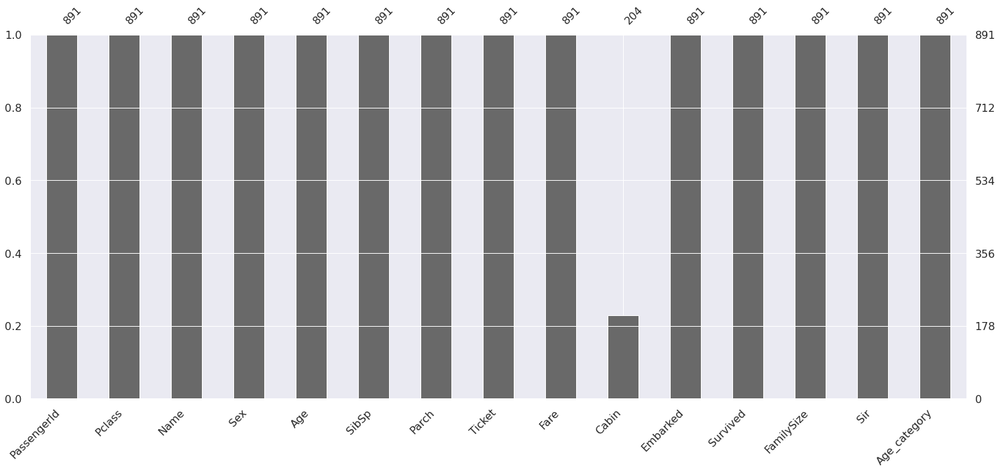

In [0]:
import missingno as msno
#msno.bar는 각 컬럼의 null 이 아닌 데이터의 비율을 그래프로 그려주는 패키지
# df_train.toPandas() : Spark DataFrame인 df_train 을 Pandas DataFrame으로 변환 
msno.bar(df=df_train.toPandas())

In [0]:
from pyspark.ml.feature import StringIndexer

In [0]:
#Sir 칸의 값을 정수로 변환 할 StringIndexer 객체 생성
#StringIndexer(inputCols=[칸이름], outputCols=[정수로 변환한 결과를 저장할 칸 이름])

#Sir칸의 문자열을 정수로 변환해서 Sir_category 컬럼에 저장

string_indexer = StringIndexer(inputCols=["Sir"], outputCols=["Sir_category"])

In [0]:
#Sir칸의 문자열 파악
sir_transformer = string_indexer.fit(df_train)

In [0]:
#Sir 칸 문자열 조회해서 리스트 리턴
# 문자열의 인덱스로 변환 할것임

#Mr->0  Miss-> 1  Mrs -> 2 Master ->3 Other -> 4
sir_transformer.labels

Out[130]: ['Mr', 'Miss', 'Mrs', 'Master', 'Other']

In [0]:
#Sir칸의 문자열을 정수로 변환해서 Sir_category에 저장
sir_transformer.transform(df_train).show()

+-----------+------+--------------------+------+-----------------+-----+-----+----------------+------------------+-----+--------+--------+----------+------+------------+------------+
|PassengerId|Pclass|                Name|   Sex|              Age|SibSp|Parch|          Ticket|              Fare|Cabin|Embarked|Survived|FamilySize|   Sir|Age_category|Sir_category|
+-----------+------+--------------------+------+-----------------+-----+-----+----------------+------------------+-----+--------+--------+----------+------+------------+------------+
|          1|     3|Braund, Mr. Owen ...|  male|             22.0|    1|    0|       A/5 21171|2.1102132003465894| null|       S|       0|         2|    Mr|         2.0|         0.0|
|          2|     1|Cumings, Mrs. Joh...|female|             38.0|    1|    0|        PC 17599|   4.2805931204649|  C85|       C|       1|         2|   Mrs|         3.0|         2.0|
|          3|     3|Heikkinen, Miss. ...|female|             26.0|    0|    0|STON/O2

In [0]:
#Sir칸의 문자열을 정수로 변환해서 Sir_category에 저장
df_train = sir_transformer.transform(df_train)

In [0]:

display(df_train)

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir,Age_category,Sir_category
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr,2.0,0.0
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs,3.0,2.0
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss,2.0,1.0
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs,3.0,2.0
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr,3.0,0.0
6,3,"Moran, Mr. James",male,32.65158924205379,0,0,330877,2.246892662898172,null,Q,0,1,Mr,3.0,0.0
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr,5.0,0.0
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master,0.0,3.0
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs,2.0,2.0
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs,1.0,2.0


In [0]:
%sql
-- 새로 추가된 컬럼이 titanic_view에 적용이 않되있음
select * from titanic_view

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr
6,3,"Moran, Mr. James",male,null,0,0,330877,2.246892662898172,null,Q,0,1,Mr
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs


In [0]:
# 컬럼이 추가 되었으므로 Spark DataFrame을 View(데이터를 추가 수정 할 수 없는 테이블) 
# 형태로 다시 변환
df_train.createOrReplaceTempView('titanic_view')

In [0]:
%sql
-- 새로 추가된 컬럼 Sir_category 가  titanic_view에 추가 되었음
select * from titanic_view

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir,Age_category,Sir_category
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr,2.0,0.0
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs,3.0,2.0
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss,2.0,1.0
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs,3.0,2.0
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr,3.0,0.0
6,3,"Moran, Mr. James",male,32.65158924205379,0,0,330877,2.246892662898172,null,Q,0,1,Mr,3.0,0.0
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr,5.0,0.0
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master,0.0,3.0
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs,2.0,2.0
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs,1.0,2.0


In [0]:
#Embarked 칸의 값을 정수로 변환 할 StringIndexer 객체 생성
#StringIndexer(inputCols=[칸이름], outputCols=[정수로 변환한 결과를 저장할 칸 이름])

#Embarked 칸의 문자열을 정수로 변환해서 Embarked_category 컬럼에 저장
string_indexer = StringIndexer(inputCols=["Embarked"], outputCols=["Embarked_category"])

In [0]:
#Embarked칸의 문자열 파악
embarked_transformer = string_indexer.fit(df_train)

In [0]:
#Embarked 칸 문자열 조회해서 리스트 리턴
# 문자열의 인덱스로 변환 할것임

#S->0  C-> 1  Q -> 2
embarked_transformer.labels

Out[139]: ['S', 'C', 'Q']

In [0]:
#Embarked 칸의 문자열을 정수로 변환해서 Embarked_category에 저장
embarked_transformer.transform(df_train).show()

+-----------+------+--------------------+------+-----------------+-----+-----+----------------+------------------+-----+--------+--------+----------+------+------------+------------+-----------------+
|PassengerId|Pclass|                Name|   Sex|              Age|SibSp|Parch|          Ticket|              Fare|Cabin|Embarked|Survived|FamilySize|   Sir|Age_category|Sir_category|Embarked_category|
+-----------+------+--------------------+------+-----------------+-----+-----+----------------+------------------+-----+--------+--------+----------+------+------------+------------+-----------------+
|          1|     3|Braund, Mr. Owen ...|  male|             22.0|    1|    0|       A/5 21171|2.1102132003465894| null|       S|       0|         2|    Mr|         2.0|         0.0|              0.0|
|          2|     1|Cumings, Mrs. Joh...|female|             38.0|    1|    0|        PC 17599|   4.2805931204649|  C85|       C|       1|         2|   Mrs|         3.0|         2.0|              

In [0]:
#Embarked 칸의 문자열을 정수로 변환해서 Embarked_category에 저장
df_train = embarked_transformer.transform(df_train)

In [0]:
display(df_train)

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir,Age_category,Sir_category,Embarked_category
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr,2.0,0.0,0.0
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs,3.0,2.0,1.0
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss,2.0,1.0,0.0
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs,3.0,2.0,0.0
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr,3.0,0.0,0.0
6,3,"Moran, Mr. James",male,32.65158924205379,0,0,330877,2.246892662898172,null,Q,0,1,Mr,3.0,0.0,2.0
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr,5.0,0.0,0.0
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master,0.0,3.0,0.0
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs,2.0,2.0,0.0
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs,1.0,2.0,1.0


In [0]:
%sql
-- 새로 추가된 컬럼이 titanic_view에 적용이 않되있음
select * from titanic_view

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir,Age_category,Sir_category
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr,2.0,0.0
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs,3.0,2.0
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss,2.0,1.0
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs,3.0,2.0
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr,3.0,0.0
6,3,"Moran, Mr. James",male,32.65158924205379,0,0,330877,2.246892662898172,null,Q,0,1,Mr,3.0,0.0
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr,5.0,0.0
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master,0.0,3.0
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs,2.0,2.0
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs,1.0,2.0


In [0]:
# 컬럼이 추가 되었으므로 Spark DataFrame을 View(데이터를 추가 수정 할 수 없는 테이블) 
# 형태로 다시 변환
df_train.createOrReplaceTempView('titanic_view')


In [0]:
%sql
-- 새로 추가된 컬럼 Embarked_category 가  titanic_view에 추가 되었음
select * from titanic_view

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir,Age_category,Sir_category,Embarked_category
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr,2.0,0.0,0.0
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs,3.0,2.0,1.0
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss,2.0,1.0,0.0
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs,3.0,2.0,0.0
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr,3.0,0.0,0.0
6,3,"Moran, Mr. James",male,32.65158924205379,0,0,330877,2.246892662898172,null,Q,0,1,Mr,3.0,0.0,2.0
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr,5.0,0.0,0.0
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master,0.0,3.0,0.0
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs,2.0,2.0,0.0
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs,1.0,2.0,1.0


In [0]:
#Sex 칸의 값을 정수로 변환 할 StringIndexer 객체 생성
#StringIndexer(inputCols=[칸이름], outputCols=[정수로 변환한 결과를 저장할 칸 이름])

#Sex 칸의 문자열을 정수로 변환해서 Sex_category 컬럼에 저장
string_indexer = StringIndexer(inputCols=["Sex"], outputCols=["Sex_category"])

In [0]:
#Sex 칸의 문자열 파악
sex_transformer = string_indexer.fit(df_train)

In [0]:
#Embarked 칸 문자열 조회해서 리스트 리턴
# 문자열의 인덱스로 변환 할것임

# male->0  femal-> 1 

sex_transformer.labels

Out[148]: ['male', 'female']

In [0]:

#Sex 칸의 문자열을 정수로 변환해서 Sex_category에 저장
sex_transformer.transform(df_train).show()

+-----------+------+--------------------+------+-----------------+-----+-----+----------------+------------------+-----+--------+--------+----------+------+------------+------------+-----------------+------------+
|PassengerId|Pclass|                Name|   Sex|              Age|SibSp|Parch|          Ticket|              Fare|Cabin|Embarked|Survived|FamilySize|   Sir|Age_category|Sir_category|Embarked_category|Sex_category|
+-----------+------+--------------------+------+-----------------+-----+-----+----------------+------------------+-----+--------+--------+----------+------+------------+------------+-----------------+------------+
|          1|     3|Braund, Mr. Owen ...|  male|             22.0|    1|    0|       A/5 21171|2.1102132003465894| null|       S|       0|         2|    Mr|         2.0|         0.0|              0.0|         0.0|
|          2|     1|Cumings, Mrs. Joh...|female|             38.0|    1|    0|        PC 17599|   4.2805931204649|  C85|       C|       1|      

In [0]:
#Sex 칸의 문자열을 정수로 변환해서 Sex_category에 저장
df_train = sex_transformer.transform(df_train)

In [0]:
display(df_train)

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir,Age_category,Sir_category,Embarked_category,Sex_category
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr,2.0,0.0,0.0,0.0
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs,3.0,2.0,1.0,1.0
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss,2.0,1.0,0.0,1.0
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs,3.0,2.0,0.0,1.0
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr,3.0,0.0,0.0,0.0
6,3,"Moran, Mr. James",male,32.65158924205379,0,0,330877,2.246892662898172,null,Q,0,1,Mr,3.0,0.0,2.0,0.0
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr,5.0,0.0,0.0,0.0
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master,0.0,3.0,0.0,0.0
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs,2.0,2.0,0.0,1.0
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs,1.0,2.0,1.0,1.0


In [0]:
%sql
-- 새로 추가된 컬럼이 titanic_view에 적용이 않되있음
select * from titanic_view

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir,Age_category,Sir_category,Embarked_category
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr,2.0,0.0,0.0
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs,3.0,2.0,1.0
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss,2.0,1.0,0.0
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs,3.0,2.0,0.0
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr,3.0,0.0,0.0
6,3,"Moran, Mr. James",male,32.65158924205379,0,0,330877,2.246892662898172,null,Q,0,1,Mr,3.0,0.0,2.0
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr,5.0,0.0,0.0
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master,0.0,3.0,0.0
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs,2.0,2.0,0.0
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs,1.0,2.0,1.0


In [0]:
# 컬럼이 추가 되었으므로 Spark DataFrame을 View(데이터를 추가 수정 할 수 없는 테이블) 
# 형태로 다시 변환
df_train.createOrReplaceTempView('titanic_view')

In [0]:
%sql
-- 새로 추가된 컬럼 Sex_category 가  titanic_view에 추가 되었음
select * from titanic_view

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir,Age_category,Sir_category,Embarked_category,Sex_category
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr,2.0,0.0,0.0,0.0
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs,3.0,2.0,1.0,1.0
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss,2.0,1.0,0.0,1.0
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs,3.0,2.0,0.0,1.0
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr,3.0,0.0,0.0,0.0
6,3,"Moran, Mr. James",male,32.65158924205379,0,0,330877,2.246892662898172,null,Q,0,1,Mr,3.0,0.0,2.0,0.0
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr,5.0,0.0,0.0,0.0
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master,0.0,3.0,0.0,0.0
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs,2.0,2.0,0.0,1.0
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs,1.0,2.0,1.0,1.0


In [0]:
#PassengerId 컬럼 삭제 ->  관련 없는 컬럼
df_train = df_train.drop("PassengerId")

In [0]:
display(df_train)

Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir,Age_category,Sir_category,Embarked_category,Sex_category
3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr,2.0,0.0,0.0,0.0
1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs,3.0,2.0,1.0,1.0
3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss,2.0,1.0,0.0,1.0
1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs,3.0,2.0,0.0,1.0
3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr,3.0,0.0,0.0,0.0
3,"Moran, Mr. James",male,32.65158924205379,0,0,330877,2.246892662898172,null,Q,0,1,Mr,3.0,0.0,2.0,0.0
1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr,5.0,0.0,0.0,0.0
3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master,0.0,3.0,0.0,0.0
3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs,2.0,2.0,0.0,1.0
2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs,1.0,2.0,1.0,1.0


In [0]:
#Name 컬럼 삭제 ->  관련 없는 컬럼
df_train = df_train.drop("Name")

In [0]:
display(df_train)

Pclass,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir,Age_category,Sir_category,Embarked_category,Sex_category
3,male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr,2.0,0.0,0.0,0.0
1,female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs,3.0,2.0,1.0,1.0
3,female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss,2.0,1.0,0.0,1.0
1,female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs,3.0,2.0,0.0,1.0
3,male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr,3.0,0.0,0.0,0.0
3,male,32.65158924205379,0,0,330877,2.246892662898172,null,Q,0,1,Mr,3.0,0.0,2.0,0.0
1,male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr,5.0,0.0,0.0,0.0
3,male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master,0.0,3.0,0.0,0.0
3,female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs,2.0,2.0,0.0,1.0
2,female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs,1.0,2.0,1.0,1.0


In [0]:
#Sex 컬럼 삭제 -> 관련 없는 컬럼
df_train = df_train.drop("Sex")

In [0]:
display(df_train)

Pclass,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir,Age_category,Sir_category,Embarked_category,Sex_category
3,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr,2.0,0.0,0.0,0.0
1,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs,3.0,2.0,1.0,1.0
3,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss,2.0,1.0,0.0,1.0
1,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs,3.0,2.0,0.0,1.0
3,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr,3.0,0.0,0.0,0.0
3,32.65158924205379,0,0,330877,2.246892662898172,null,Q,0,1,Mr,3.0,0.0,2.0,0.0
1,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr,5.0,0.0,0.0,0.0
3,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master,0.0,3.0,0.0,0.0
3,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs,2.0,2.0,0.0,1.0
2,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs,1.0,2.0,1.0,1.0


In [0]:
#Age 컬럼 삭제 -> Age_category 사용
df_train = df_train.drop("Age")

In [0]:
display(df_train)

Pclass,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir,Age_category,Sir_category,Embarked_category,Sex_category
3,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr,2.0,0.0,0.0,0.0
1,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs,3.0,2.0,1.0,1.0
3,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss,2.0,1.0,0.0,1.0
1,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs,3.0,2.0,0.0,1.0
3,0,0,373450,2.2027647577118348,null,S,0,1,Mr,3.0,0.0,0.0,0.0
3,0,0,330877,2.246892662898172,null,Q,0,1,Mr,3.0,0.0,2.0,0.0
1,0,0,17463,3.967694202798607,E46,S,0,1,Mr,5.0,0.0,0.0,0.0
3,3,1,349909,3.094445746490024,null,S,0,5,Master,0.0,3.0,0.0,0.0
3,0,2,347742,2.4959537387180646,null,S,1,3,Mrs,2.0,2.0,0.0,1.0
2,1,0,237736,3.436268471383741,null,C,1,2,Mrs,1.0,2.0,1.0,1.0


In [0]:
#Ticket 컬럼 삭제 -> 관련 없는 컬럼
df_train = df_train.drop("Ticket")

In [0]:
display(df_train)

Pclass,SibSp,Parch,Fare,Cabin,Embarked,Survived,FamilySize,Sir,Age_category,Sir_category,Embarked_category,Sex_category
3,1,0,2.1102132003465894,null,S,0,2,Mr,2.0,0.0,0.0,0.0
1,1,0,4.2805931204649,C85,C,1,2,Mrs,3.0,2.0,1.0,1.0
3,0,0,2.188856327665703,null,S,1,1,Miss,2.0,1.0,0.0,1.0
1,1,0,3.9908341858524357,C123,S,1,2,Mrs,3.0,2.0,0.0,1.0
3,0,0,2.2027647577118348,null,S,0,1,Mr,3.0,0.0,0.0,0.0
3,0,0,2.246892662898172,null,Q,0,1,Mr,3.0,0.0,2.0,0.0
1,0,0,3.967694202798607,E46,S,0,1,Mr,5.0,0.0,0.0,0.0
3,3,1,3.094445746490024,null,S,0,5,Master,0.0,3.0,0.0,0.0
3,0,2,2.4959537387180646,null,S,1,3,Mrs,2.0,2.0,0.0,1.0
2,1,0,3.436268471383741,null,C,1,2,Mrs,1.0,2.0,1.0,1.0


In [0]:
#Cabin 컬럼 삭제 -> 관련 없는 컬럼
df_train = df_train.drop("Cabin")

In [0]:
display(df_train)

Pclass,SibSp,Parch,Fare,Embarked,Survived,FamilySize,Sir,Age_category,Sir_category,Embarked_category,Sex_category
3,1,0,2.1102132003465894,S,0,2,Mr,2.0,0.0,0.0,0.0
1,1,0,4.2805931204649,C,1,2,Mrs,3.0,2.0,1.0,1.0
3,0,0,2.188856327665703,S,1,1,Miss,2.0,1.0,0.0,1.0
1,1,0,3.9908341858524357,S,1,2,Mrs,3.0,2.0,0.0,1.0
3,0,0,2.2027647577118348,S,0,1,Mr,3.0,0.0,0.0,0.0
3,0,0,2.246892662898172,Q,0,1,Mr,3.0,0.0,2.0,0.0
1,0,0,3.967694202798607,S,0,1,Mr,5.0,0.0,0.0,0.0
3,3,1,3.094445746490024,S,0,5,Master,0.0,3.0,0.0,0.0
3,0,2,2.4959537387180646,S,1,3,Mrs,2.0,2.0,0.0,1.0
2,1,0,3.436268471383741,C,1,2,Mrs,1.0,2.0,1.0,1.0


In [0]:
#Embarked 컬럼 삭제 -> EmbarkedCategory 사용
df_train = df_train.drop("Embarked")

In [0]:
display(df_train)

Pclass,SibSp,Parch,Fare,Survived,FamilySize,Sir,Age_category,Sir_category,Embarked_category,Sex_category
3,1,0,2.1102132003465894,0,2,Mr,2.0,0.0,0.0,0.0
1,1,0,4.2805931204649,1,2,Mrs,3.0,2.0,1.0,1.0
3,0,0,2.188856327665703,1,1,Miss,2.0,1.0,0.0,1.0
1,1,0,3.9908341858524357,1,2,Mrs,3.0,2.0,0.0,1.0
3,0,0,2.2027647577118348,0,1,Mr,3.0,0.0,0.0,0.0
3,0,0,2.246892662898172,0,1,Mr,3.0,0.0,2.0,0.0
1,0,0,3.967694202798607,0,1,Mr,5.0,0.0,0.0,0.0
3,3,1,3.094445746490024,0,5,Master,0.0,3.0,0.0,0.0
3,0,2,2.4959537387180646,1,3,Mrs,2.0,2.0,0.0,1.0
2,1,0,3.436268471383741,1,2,Mrs,1.0,2.0,1.0,1.0


In [0]:
#Sir 컬럼 삭제 -> SirCategory 사용
df_train = df_train.drop("Sir")

In [0]:
display(df_train)

Pclass,SibSp,Parch,Fare,Survived,FamilySize,Age_category,Sir_category,Embarked_category,Sex_category
3,1,0,2.1102132003465894,0,2,2.0,0.0,0.0,0.0
1,1,0,4.2805931204649,1,2,3.0,2.0,1.0,1.0
3,0,0,2.188856327665703,1,1,2.0,1.0,0.0,1.0
1,1,0,3.9908341858524357,1,2,3.0,2.0,0.0,1.0
3,0,0,2.2027647577118348,0,1,3.0,0.0,0.0,0.0
3,0,0,2.246892662898172,0,1,3.0,0.0,2.0,0.0
1,0,0,3.967694202798607,0,1,5.0,0.0,0.0,0.0
3,3,1,3.094445746490024,0,5,0.0,3.0,0.0,0.0
3,0,2,2.4959537387180646,1,3,2.0,2.0,0.0,1.0
2,1,0,3.436268471383741,1,2,1.0,2.0,1.0,1.0


In [0]:
df_train.schema

Out[171]: StructType(List(StructField(Pclass,IntegerType,true),StructField(SibSp,IntegerType,true),StructField(Parch,IntegerType,true),StructField(Fare,DoubleType,true),StructField(Survived,IntegerType,true),StructField(FamilySize,IntegerType,true),StructField(Age_category,DoubleType,true),StructField(Sir_category,DoubleType,false),StructField(Embarked_category,DoubleType,false),StructField(Sex_category,DoubleType,false)))

In [0]:
#컬럼명 조회
df_train.columns

Out[172]: ['Pclass',
 'SibSp',
 'Parch',
 'Fare',
 'Survived',
 'FamilySize',
 'Age_category',
 'Sir_category',
 'Embarked_category',
 'Sex_category']

In [0]:
##컬럼명을 columns 에 저장
columns = df_train.columns

In [0]:
#컬럼명들이 저장된 리스트 조회
columns

Out[174]: ['Pclass',
 'SibSp',
 'Parch',
 'Fare',
 'Survived',
 'FamilySize',
 'Age_category',
 'Sir_category',
 'Embarked_category',
 'Sex_category']

In [0]:
#컬럼명 리스트에서 종속 변수 컬럼명 삭제
columns.remove("Survived")

In [0]:
columns

Out[176]: ['Pclass',
 'SibSp',
 'Parch',
 'Fare',
 'FamilySize',
 'Age_category',
 'Sir_category',
 'Embarked_category',
 'Sex_category']

In [0]:
from pyspark.ml.feature import VectorAssembler

In [0]:
# inputCols=columns 
# columns (['Pclass', 'SibSp', 'Parch', 'Fare', 'FamilySize', 'Age_category', 
#          'Sir_category', 'Embarked_category', 'Sex_category'])  컬럼의 값(독립변수값)을 합쳐서
# outputCol="features" : feature 컬럼을 생성 
# 할 객체 VectorAssembler 
assembler = VectorAssembler(inputCols=columns, outputCol="features")

In [0]:
# df_train 의 columns (['Pclass', 'SibSp', 'Parch', 'Fare', 'FamilySize', 
#                       'Age_category', 'Sir_category', 'Embarked_category', 
#                        'Sex_category'])  컬럼의 값을 합쳐서 feature 컬럼을 생성 

asembler_df = assembler.transform(df_train)

In [0]:
display(asembler_df.show())

+------+-----+-----+------------------+--------+----------+------------+------------+-----------------+------------+--------------------+
|Pclass|SibSp|Parch|              Fare|Survived|FamilySize|Age_category|Sir_category|Embarked_category|Sex_category|            features|
+------+-----+-----+------------------+--------+----------+------------+------------+-----------------+------------+--------------------+
|     3|    1|    0|2.1102132003465894|       0|         2|         2.0|         0.0|              0.0|         0.0|[3.0,1.0,0.0,2.11...|
|     1|    1|    0|   4.2805931204649|       1|         2|         3.0|         2.0|              1.0|         1.0|[1.0,1.0,0.0,4.28...|
|     3|    0|    0| 2.188856327665703|       1|         1|         2.0|         1.0|              0.0|         1.0|[3.0,0.0,0.0,2.18...|
|     1|    1|    0|3.9908341858524357|       1|         2|         3.0|         2.0|              0.0|         1.0|[1.0,1.0,0.0,3.99...|
|     3|    0|    0|2.202764757711

In [0]:
# asembler_df 의 데이터를 7:3 으로 나눠서
# 70%는 trainingData 에 대입
# 30%는 testData에 대입
(trainingData, testData) = asembler_df.randomSplit([0.7, 0.3])

In [0]:
# trainingData 출력
display(trainingData)

Pclass,SibSp,Parch,Fare,Survived,FamilySize,Age_category,Sir_category,Embarked_category,Sex_category,features
1,0,0,0.0,0,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 4, 5), values -> List(1.0, 1.0, 3.0))"
1,0,0,0.0,0,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 4, 5), values -> List(1.0, 1.0, 3.0))"
1,0,0,0.0,0,1,3.0,4.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 4, 5, 6), values -> List(1.0, 1.0, 3.0, 4.0))"
1,0,0,3.2804411805263554,0,1,4.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.2804411805263554, 1.0, 4.0))"
1,0,0,3.2930552230424524,0,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.2930552230424524, 1.0, 3.0))"
1,0,0,3.2932111997353943,1,1,4.0,0.0,0.0,1.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.2932111997353943, 1.0, 4.0, 0.0, 0.0, 1.0))"
1,0,0,3.2932111997353943,1,1,4.0,2.0,0.0,1.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.2932111997353943, 1.0, 4.0, 2.0, 0.0, 1.0))"
1,0,0,3.295836866004329,0,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.295836866004329, 1.0, 3.0))"
1,0,0,3.295836866004329,0,1,6.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.295836866004329, 1.0, 6.0))"
1,0,0,3.3064287218760624,1,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3064287218760624, 1.0, 3.0))"


In [0]:
# testData 조회

display(testData)

Pclass,SibSp,Parch,Fare,Survived,FamilySize,Age_category,Sir_category,Embarked_category,Sex_category,features
1,0,0,0.0,0,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 4, 5), values -> List(1.0, 1.0, 3.0))"
1,0,0,0.0,0,1,4.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 4, 5), values -> List(1.0, 1.0, 4.0))"
1,0,0,1.791759469228055,0,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 1.791759469228055, 1.0, 3.0))"
1,0,0,3.3160025355989236,1,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3160025355989236, 1.0, 3.0))"
1,0,0,3.3160025355989236,1,1,4.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3160025355989236, 1.0, 4.0))"
1,0,0,3.3843902633457743,0,1,4.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3843902633457743, 1.0, 4.0))"
1,0,0,3.391567832686312,0,1,5.0,1.0,1.0,1.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.391567832686312, 1.0, 5.0, 1.0, 1.0, 1.0))"
1,0,0,3.4242626545931514,1,1,3.0,0.0,1.0,0.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.4242626545931514, 1.0, 3.0, 0.0, 1.0, 0.0))"
1,0,0,3.4339872044851463,1,1,1.0,1.0,0.0,1.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.4339872044851463, 1.0, 1.0, 1.0, 0.0, 1.0))"
1,0,0,3.449987545831587,1,1,3.0,0.0,1.0,0.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.449987545831587, 1.0, 3.0, 0.0, 1.0, 0.0))"


In [0]:
from pyspark.ml.classification import RandomForestClassifier

In [0]:
# RandomForestClassifier 객체 생성
# featuresCol = "features" : 독립변수는 features 컬럼에 저장되 있음
# labelCol = "Survived" : 종속 변수는 Survived 컬럼에 저장되 있음
# numTrees=100 : DecisionTree 개수 100
rf = RandomForestClassifier(featuresCol = "features", labelCol = "Survived", numTrees=100)

In [0]:
# trainingData를 이용해서 RandomForest에 포함된 Decision Tree들을 만듬
rfModel = rf.fit(trainingData)

In [0]:
rfModel

Out[187]: RandomForestClassificationModel: uid=RandomForestClassifier_1fcf31816b49, numTrees=100, numClasses=2, numFeatures=9

In [0]:
# dtModel.transform(testData) : testData 를 예측
prediction = rfModel.transform(testData)

In [0]:
# 예측값 조회
display(prediction)

Pclass,SibSp,Parch,Fare,Survived,FamilySize,Age_category,Sir_category,Embarked_category,Sex_category,features,rawPrediction,probability,prediction
1,0,0,0.0,0,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 4, 5), values -> List(1.0, 1.0, 3.0))","Map(vectorType -> dense, length -> 2, values -> List(83.26144982211699, 16.738550177883024))","Map(vectorType -> dense, length -> 2, values -> List(0.8326144982211697, 0.16738550177883021))",0.0
1,0,0,0.0,0,1,4.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 4, 5), values -> List(1.0, 1.0, 4.0))","Map(vectorType -> dense, length -> 2, values -> List(82.71446623928199, 17.28553376071801))","Map(vectorType -> dense, length -> 2, values -> List(0.8271446623928199, 0.1728553376071801))",0.0
1,0,0,1.791759469228055,0,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 1.791759469228055, 1.0, 3.0))","Map(vectorType -> dense, length -> 2, values -> List(83.26144982211699, 16.738550177883024))","Map(vectorType -> dense, length -> 2, values -> List(0.8326144982211697, 0.16738550177883021))",0.0
1,0,0,3.3160025355989236,1,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3160025355989236, 1.0, 3.0))","Map(vectorType -> dense, length -> 2, values -> List(71.77280699189215, 28.227193008107815))","Map(vectorType -> dense, length -> 2, values -> List(0.7177280699189217, 0.2822719300810782))",0.0
1,0,0,3.3160025355989236,1,1,4.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3160025355989236, 1.0, 4.0))","Map(vectorType -> dense, length -> 2, values -> List(71.83108656695191, 28.168913433048065))","Map(vectorType -> dense, length -> 2, values -> List(0.7183108656695193, 0.2816891343304807))",0.0
1,0,0,3.3843902633457743,0,1,4.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3843902633457743, 1.0, 4.0))","Map(vectorType -> dense, length -> 2, values -> List(70.56577529699108, 29.434224703008905))","Map(vectorType -> dense, length -> 2, values -> List(0.7056577529699108, 0.2943422470300891))",0.0
1,0,0,3.391567832686312,0,1,5.0,1.0,1.0,1.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.391567832686312, 1.0, 5.0, 1.0, 1.0, 1.0))","Map(vectorType -> dense, length -> 2, values -> List(6.523924909851527, 93.47607509014846))","Map(vectorType -> dense, length -> 2, values -> List(0.06523924909851528, 0.9347607509014847))",1.0
1,0,0,3.4242626545931514,1,1,3.0,0.0,1.0,0.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.4242626545931514, 1.0, 3.0, 0.0, 1.0, 0.0))","Map(vectorType -> dense, length -> 2, values -> List(73.4267493826486, 26.5732506173514))","Map(vectorType -> dense, length -> 2, values -> List(0.7342674938264859, 0.26573250617351396))",0.0
1,0,0,3.4339872044851463,1,1,1.0,1.0,0.0,1.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.4339872044851463, 1.0, 1.0, 1.0, 0.0, 1.0))","Map(vectorType -> dense, length -> 2, values -> List(7.062725467344431, 92.93727453265555))","Map(vectorType -> dense, length -> 2, values -> List(0.07062725467344431, 0.9293727453265557))",1.0
1,0,0,3.449987545831587,1,1,3.0,0.0,1.0,0.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.449987545831587, 1.0, 3.0, 0.0, 1.0, 0.0))","Map(vectorType -> dense, length -> 2, values -> List(73.4267493826486, 26.5732506173514))","Map(vectorType -> dense, length -> 2, values -> List(0.7342674938264859, 0.26573250617351396))",0.0


In [0]:
#Survived (실제값), prediction ("예측값") 컬럼 조회
display(prediction["Survived", "prediction"])

Survived,prediction
0,0.0
0,0.0
0,0.0
1,0.0
1,0.0
0,0.0
0,1.0
1,0.0
1,1.0
1,0.0


In [0]:
# prediction.Survived : prediction의 Survived 컬럼 
# prediction.prediction : prediction의 prediction 컬럼
# prediction.Survived == prediction.prediction  : Survived 컬럼의 값과 prediction 컬럼의 값이 같은 레코드 조회
right_predict = prediction.filter( prediction.Survived == prediction.prediction )

In [0]:
# prediction.Survived == prediction.prediction  : Survived 컬럼의 값과 prediction 컬럼의 값이 같은 레코드 조회
display(right_predict)

Pclass,SibSp,Parch,Fare,Survived,FamilySize,Age_category,Sir_category,Embarked_category,Sex_category,features,rawPrediction,probability,prediction
1,0,0,0.0,0,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 4, 5), values -> List(1.0, 1.0, 3.0))","Map(vectorType -> dense, length -> 2, values -> List(83.26144982211699, 16.738550177883024))","Map(vectorType -> dense, length -> 2, values -> List(0.8326144982211697, 0.16738550177883021))",0.0
1,0,0,0.0,0,1,4.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 4, 5), values -> List(1.0, 1.0, 4.0))","Map(vectorType -> dense, length -> 2, values -> List(82.71446623928199, 17.28553376071801))","Map(vectorType -> dense, length -> 2, values -> List(0.8271446623928199, 0.1728553376071801))",0.0
1,0,0,1.791759469228055,0,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 1.791759469228055, 1.0, 3.0))","Map(vectorType -> dense, length -> 2, values -> List(83.26144982211699, 16.738550177883024))","Map(vectorType -> dense, length -> 2, values -> List(0.8326144982211697, 0.16738550177883021))",0.0
1,0,0,3.3843902633457743,0,1,4.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3843902633457743, 1.0, 4.0))","Map(vectorType -> dense, length -> 2, values -> List(70.56577529699108, 29.434224703008905))","Map(vectorType -> dense, length -> 2, values -> List(0.7056577529699108, 0.2943422470300891))",0.0
1,0,0,3.4339872044851463,1,1,1.0,1.0,0.0,1.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.4339872044851463, 1.0, 1.0, 1.0, 0.0, 1.0))","Map(vectorType -> dense, length -> 2, values -> List(7.062725467344431, 92.93727453265555))","Map(vectorType -> dense, length -> 2, values -> List(0.07062725467344431, 0.9293727453265557))",1.0
1,0,0,3.4561841799918147,0,1,3.0,0.0,1.0,0.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.4561841799918147, 1.0, 3.0, 0.0, 1.0, 0.0))","Map(vectorType -> dense, length -> 2, values -> List(73.4267493826486, 26.5732506173514))","Map(vectorType -> dense, length -> 2, values -> List(0.7342674938264859, 0.26573250617351396))",0.0
1,0,0,3.5409593240373143,0,1,6.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.5409593240373143, 1.0, 6.0))","Map(vectorType -> dense, length -> 2, values -> List(73.61155442646722, 26.38844557353276))","Map(vectorType -> dense, length -> 2, values -> List(0.7361155442646723, 0.26388445573532765))",0.0
1,0,0,3.57386695198272,0,1,7.0,0.0,1.0,0.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.57386695198272, 1.0, 7.0, 0.0, 1.0, 0.0))","Map(vectorType -> dense, length -> 2, values -> List(72.10313899934508, 27.89686100065492))","Map(vectorType -> dense, length -> 2, values -> List(0.7210313899934507, 0.2789686100065492))",0.0
1,0,0,3.597312260588446,0,1,4.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.597312260588446, 1.0, 4.0))","Map(vectorType -> dense, length -> 2, values -> List(72.09841156753058, 27.901588432469406))","Map(vectorType -> dense, length -> 2, values -> List(0.7209841156753058, 0.2790158843246941))",0.0
1,0,0,3.922056501139853,1,1,2.0,1.0,1.0,1.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.922056501139853, 1.0, 2.0, 1.0, 1.0, 1.0))","Map(vectorType -> dense, length -> 2, values -> List(6.169884248570966, 93.83011575142903))","Map(vectorType -> dense, length -> 2, values -> List(0.061698842485709664, 0.9383011575142903))",1.0


In [0]:
# prediction.Survived == prediction.prediction  : Survived 컬럼의 값과 prediction 컬럼의 값이 같은 레코드 조회
#Survived 컬럼 (실제값), prediction 컬럼 (예측값) 컬럼 조회
display(right_predict["Survived","prediction"])

Survived,prediction
0,0.0
0,0.0
0,0.0
0,0.0
1,1.0
0,0.0
0,0.0
0,0.0
0,0.0
1,1.0


In [0]:
# prediction.Survived == prediction.prediction  : Survived 컬럼의 값과 prediction 컬럼의 값이 같은 레코드 수 조회
right_predict.count()

Out[194]: 213

In [0]:
# 전체 예측값 개수 조회
prediction.count()

Out[195]: 261

In [0]:
# 정확도 계산
right_predict.count() / prediction.count()

Out[196]: 0.8160919540229885

In [0]:
# trainingData.toPandas() : 학습데이터를 pandas 의 DataFrame으로 변환
dataset = trainingData.toPandas()
dataset

,Pclass,SibSp,Parch,Fare,Survived,FamilySize,Age_category,Sir_category,Embarked_category,Sex_category,features
0,1,0,0,0.000000,0,1,3.0,0.0,0.0,0.0,"(1.0, 0.0, 0.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0)"
1,1,0,0,0.000000,0,1,3.0,0.0,0.0,0.0,"(1.0, 0.0, 0.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0)"
2,1,0,0,0.000000,0,1,3.0,4.0,0.0,0.0,"(1.0, 0.0, 0.0, 0.0, 1.0, 3.0, 4.0, 0.0, 0.0)"
3,1,0,0,3.280441,0,1,4.0,0.0,0.0,0.0,"(1.0, 0.0, 0.0, 3.2804411805263554, 1.0, 4.0, ..."
4,1,0,0,3.293055,0,1,3.0,0.0,0.0,0.0,"(1.0, 0.0, 0.0, 3.2930552230424524, 1.0, 3.0, ..."
...,...,...,...,...,...,...,...,...,...,...,...
625,3,5,2,3.869116,0,8,1.0,1.0,0.0,1.0,"[3.0, 5.0, 2.0, 3.8691155044168695, 8.0, 1.0, ..."
626,3,5,2,3.869116,0,8,1.0,3.0,0.0,0.0,"[3.0, 5.0, 2.0, 3.8691155044168695, 8.0, 1.0, ..."
627,3,8,2,4.256322,0,11,0.0,3.0,0.0,0.0,"[3.0, 8.0, 2.0, 4.256321678298823, 11.0, 0.0, ..."
628,3,8,2,4.256322,0,11,2.0,1.0,0.0,1.0,"[3.0, 8.0, 2.0, 4.256321678298823, 11.0, 2.0, ..."


In [0]:
# columns (['Pclass', 'SibSp', 'Parch', 'Fare', 'FamilySize',
#          'Age_category', 'Sir_category', 'Embarked_category',
#          'Sex_category']) + "Survived" 컬럼만 dataset에 대입
dataset = dataset[columns + ["Survived"]]

In [0]:
dataset

,Pclass,SibSp,Parch,Fare,FamilySize,Age_category,Sir_category,Embarked_category,Sex_category,Survived
0,1,0,0,0.000000,1,3.0,0.0,0.0,0.0,0
1,1,0,0,0.000000,1,3.0,0.0,0.0,0.0,0
2,1,0,0,0.000000,1,3.0,4.0,0.0,0.0,0
3,1,0,0,3.280441,1,4.0,0.0,0.0,0.0,0
4,1,0,0,3.293055,1,3.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...
625,3,5,2,3.869116,8,1.0,1.0,0.0,1.0,0
626,3,5,2,3.869116,8,1.0,3.0,0.0,0.0,0
627,3,8,2,4.256322,11,0.0,3.0,0.0,0.0,0
628,3,8,2,4.256322,11,2.0,1.0,0.0,1.0,0


In [0]:
import dtreeviz
# Decosion Tree의 출력 정보 설정
viz_model = dtreeviz.model(
                              rfModel.trees[99], # RandomForest 의 99번째 Decision Tree 객체
                               # columns (['Pclass', 'SibSp', 'Parch', 
                               #         'Fare', 'FamilySize', 'Age_category',
                               #         'Sir_category', 'Embarked_category', 
                               #         'Sex_category'])독립변수 데이터
                               
                              X_train = dataset[columns],
                              y_train = dataset["Survived"], # 종속 변수 데이터
                              
                             # 독립변수 컬럼의 이름
                             # columns (['Pclass', 'SibSp', 'Parch', 
                             #         'Fare', 'FamilySize', 'Age_category',
                             #         'Sir_category', 'Embarked_category', 
                             #         'Sex_category'])
                             feature_names=columns, 
                             target_name="Survived", # 종속 변수 컬럼의 이름
                             class_names=["dead", "survived"] # 종속 변수 데이터
                             )

In [0]:
# Decision Tree의 내용 시각화
v = viz_model.view().svg()

In [0]:
#Decision Tree의 내용 출력
displayHTML(v)

G 
 
 
 cluster_legend 
 

 
 node5 
 
 
 
 
 
 2023-06-28T05:37:34.271625 
 image/svg+xml 
 
 
 Matplotlib v3.4.2, https://matplotlib.org/ 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <path d="M 2597 2516 Q 3050 2419 3304 2112 Q 3559 1806 3559 1356 Q 3559 666 3084 287 Q 2609 -91 1734 -91 Q 1441 -91 1130 -33 Q 819 25 488 141 L 488 750 Q 750 597 1062 519 Q 1375 441 1716 441 Q 2309 441 2620 675 Q 2931 909 2931 1356 Q 2931 1769 2642 2001 Q 2353 2234 1838 2234 L 1294 2234 L 1294 2753 L 1863 2753 Q 2328 2753 2575 2939 Q 2822 3125 2822 3475 Q 2822 3834 2567 4026 Q 2313 4219 1838 4219 Q 1578 4219 1281 4162 Q 984 4106 628 3988 L 628 4550 Q 988 4650 1302 4700 Q 1616 4750 1894 4750 Q 2613 4750 3031 4423 Q 3450 4097 3450 3541 Q 3450 3153 3228 2886 Q 3006 2619 2597 2516 z " id="DejaVuSans-33" transform="scale(0.015625)" />
 
 
 
 
 
 
 
 
 
 
 
 
 
 <path d="M 2113 2584 Q 1688 2584 1439 2293 Q 1191 2003 1191 1497 Q 1191 994 1439 701 Q 1688 409 2113 409 Q 2538 409 2786 701 Q 3034 994 3034 1497 Q 3034 2003 2786 2293 Q 2538 2584 2113 2584 z M 3366 4563 L 3366 3988 Q 3128 4100 2886 4159 Q 2644 4219 2406 4219 Q 1781 4219 1451 3797 Q 1122 3375 1075 2522 Q 1259 2794 1537 2939 Q 1816 3084 2150 3084 Q 2853 3084 3261 2657 Q 3669 2231 3669 1497 Q 3669 778 3244 343 Q 2819 -91 2113 -91 Q 1303 -91 875 529 Q 447 1150 447 2328 Q 447 3434 972 4092 Q 1497 4750 2381 4750 Q 2619 4750 2861 4703 Q 3103 4656 3366 4563 z " id="DejaVuSans-36" transform="scale(0.015625)" />
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <path d="M 2194 1759 Q 1497 1759 1228 1600 Q 959 1441 959 1056 Q 959 750 1161 570 Q 1363 391 1709 391 Q 2188 391 2477 730 Q 2766 1069 2766 1631 L 2766 1759 L 2194 1759 z M 3341 1997 L 3341 0 L 2766 0 L 2766 531 Q 2569 213 2275 61 Q 1981 -91 1556 -91 Q 1019 -91 701 211 Q 384 513 384 1019 Q 384 1609 779 1909 Q 1175 2209 1959 2209 L 2766 2209 L 2766 2266 Q 2766 2663 2505 2880 Q 2244 3097 1772 3097 Q 1472 3097 1187 3025 Q 903 2953 641 2809 L 641 3341 Q 956 3463 1253 3523 Q 1550 3584 1831 3584 Q 2591 3584 2966 3190 Q 3341 2797 3341 1997 z " id="DejaVuSans-61" transform="scale(0.015625)" />
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <path d="M 2034 2216 Q 1584 2216 1326 1975 Q 1069 1734 1069 1313 Q 1069 891 1326 650 Q 1584 409 2034 409 Q 2484 409 2743 651 Q 3003 894 3003 1313 Q 3003 1734 2745 1975 Q 2488 2216 2034 2216 z M 1403 2484 Q 997 2584 770 2862 Q 544 3141 544 3541 Q 544 4100 942 4425 Q 1341 4750 2034 4750 Q 2731 4750 3128 4425 Q 3525 4100 3525 3541 Q 3525 3141 3298 2862 Q 3072 2584 2669 2484 Q 3125 2378 3379 2068 Q 3634 1759 3634 1313 Q 3634 634 3220 271 Q 2806 -91 2034 -91 Q 1263 -91 848 271 Q 434 634 434 1313 Q 434 1759 690 2068 Q 947 2378 1403 2484 z M 1172 3481 Q 1172 3119 1398 2916 Q 1625 2713 2034 2713 Q 2441 2713 2670 2916 Q 2900 3119 2900 3481 Q 2900 3844 2670 4047 Q 2441 4250 2034 4250 Q 1625 4250 1398 4047 Q 1172 3844 1172 3481 z " id="DejaVuSans-38" transform="scale(0.015625)" />
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 

 
 leaf6 
 
 
 
 
 
 
 2023-06-28T05:37:37.493832 
 image/svg+xml 
 
 
 Matplotlib v3.4.2, https://matplotlib.org/ 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <path d="M 31.879733 6.174908 C 30.725355 4.691763 29.318718 3.423466 27.724402 2.428245 C 26.130087 1.433023 24.37287 0.726345 22.533427 0.340655 C 20.693984 -0.045036 18.800902 -0.103745 16.941095 0.167223 C 15.081287 0.43819 13.283658 1.034623 11.630736 1.92914 C 9.977815 2.823656 8.495291 4.002353 7.251228 5.411116 C 6.007164 6.81988 5.020896 8.436815 4.337703 10.187688 C 3.65451 11.93856 3.285011 13.79616 3.246169 15.675202 C 3.207326 17.554244 3.499745 19.425526 4.109999 21.203136 C 4.720253 22.980746 5.638859 24.637057 6.823642 26.096028 C 8.008426 27.554999 9.440974 28.793955 11.055517 29.756014 C 12.67006 30.7180